In [258]:
import os
import pandas as pd

directory = r'Datos\\Series-csv'

# !!!!!!!!!!!!!! Tenia un codigo muy feo y le pedi a chat ayuda para que se viera mas bonito !!!!!!!!!!!!!!

# Dictionary to store dataframes
dataframes = {}

# Iterate over all files in the directory
for i, filename in enumerate(os.listdir(directory), start=1):
    file_path = os.path.join(directory, filename)
    dataframes[f'df{i}'] = pd.read_csv(file_path)

# Extract specific dataframes
dfs = [dataframes[f'df{i}'] for i in range(1, 13)] # Hay 12 archivos

# Function to clean dataframe
def clean_dataframe(df):
    df = df.drop([0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16]).reset_index(drop=True) # Solo usan la fila 8, borro hasta que hay datos y reseteo el index
    df.columns = df.iloc[0] # La primera fila es el nombre de las columnas
    return df.drop([0]).reset_index(drop=True) # Borro la primera fila y reseteo el index

# Clean all dataframes
dfs = [clean_dataframe(df) for df in dfs]

# Assign cleaned dataframes back to individual variables
df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11, df12 = dfs


C:\Users\herie\AppData\Local\Temp\ipykernel_33904\1856070868.py:14: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,81,82,83,84,93,94,95,96,97,98,99,100,101,102,103,104,109,110,111,112,121,122,123,124,157,158,159,160,161,162,163,164,165,166,167,168) have mixed types. Specify dtype option on import or set low_memory=False.
  dataframes[f'df{i}'] = pd.read_csv(file_path)


In [259]:
pd.set_option('display.max_columns', None)

In [260]:
# Assign cleaned dataframes back to individual variables
df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11, df12 = dfs

## **Vamos a hacer que todos tengan el mismo Índice, que va a ser el primer día del mes desde 2010**

In [261]:
# uso mucho esto entonces lo hago una funcion

def interpolation(df4):
    df4 = df4.apply(pd.to_numeric, errors='coerce')
    complete_idx = pd.period_range(start=df4.index.min(), end=df4.index.max(), freq='M')
    df4 = df4.reindex(complete_idx)
    df4 = df4.interpolate(method='linear')
    return df4

def clean_df(df3, do_interpolation=False):
    # hacemos que la fecha sea el index
    df3 = df3.set_index("Título")
    df3.index.names = ["Fecha"]
    df3.index = pd.to_datetime(df3.index)
    df3.index = df3.index.to_period("M")
    df3 = df3.apply(pd.to_numeric, errors='coerce')
    if do_interpolation:
        df3 = interpolation(df3)
    df3 = df3.groupby(df3.index).first()
    df3 = df3.loc["2011-04":"2024-05"]
    return df3

### DF1

In [262]:
df1.head()

,Título,"TIIE de Fondeo a Un Día Hábil Bancario, Mediana ponderada por volumen","TIIE a 28 días, Tasa de interés en por ciento anual","Tasas de interés interbancarias Por ciento anual, TIIE a 91 días",TIIE a 182 días,"Tasas de interés interbancarias Por ciento anual, TIIP a 28 días"
0,2006-01-02 00:00:00,8.27,8.57,N/E,N/E,N/E
1,2006-01-03 00:00:00,8.28,8.565,N/E,N/E,N/E
2,2006-01-04 00:00:00,8.28,8.55,N/E,N/E,N/E
3,2006-01-05 00:00:00,8.28,8.565,8.28,N/E,N/E
4,2006-01-06 00:00:00,8.28,8.575,N/E,N/E,N/E


In [263]:
df1 =  clean_df(df1)
df1.head()

,"TIIE de Fondeo a Un Día Hábil Bancario, Mediana ponderada por volumen","TIIE a 28 días, Tasa de interés en por ciento anual","Tasas de interés interbancarias Por ciento anual, TIIE a 91 días",TIIE a 182 días,"Tasas de interés interbancarias Por ciento anual, TIIP a 28 días"
Fecha,,,,,
2011-04,4.50,4.8331,4.862,4.9750,NaN
2011-05,4.50,4.8400,4.875,4.9700,NaN
2011-06,4.45,4.8725,4.915,4.9650,NaN
2011-07,4.51,4.8500,4.880,4.9175,NaN
2011-08,4.45,4.8050,4.840,4.8950,NaN


In [264]:
df1 = df1.drop(df1.columns[[3, 4]], axis=1)
df1.head()


,"TIIE de Fondeo a Un Día Hábil Bancario, Mediana ponderada por volumen","TIIE a 28 días, Tasa de interés en por ciento anual","Tasas de interés interbancarias Por ciento anual, TIIE a 91 días"
Fecha,,,
2011-04,4.50,4.8331,4.862
2011-05,4.50,4.8400,4.875
2011-06,4.45,4.8725,4.915
2011-07,4.51,4.8500,4.880
2011-08,4.45,4.8050,4.840


### DF2

In [265]:
df2.head()

,Título,"Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (todas las marcas)","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), A","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), B","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), C","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), D","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), E","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), F","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), G","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), H","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), I","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), J","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), K","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), L","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), M","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), N","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), O","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), P","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), Q","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), R","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), S","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), T","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), U","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), V","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), W","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), X","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), Y","Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (mastercard)","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), B","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), C","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), D","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), E","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), F","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), G","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), H","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), I","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), J","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), K","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), M","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), N","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), O","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), T","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), U","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), V","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), W","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), X","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), Y","Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (visa)","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), A","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), B","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), C","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), D","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), E","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), F","Sistemas de pago de bajo valor, Tarjetas de cré

In [266]:
df2 = clean_df(df2, do_interpolation=True)
df2.head()

,"Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (todas las marcas)","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), A","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), B","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), C","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), D","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), E","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), F","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), G","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), H","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), I","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), J","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), K","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), L","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), M","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), N","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), O","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), P","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), Q","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), R","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), S","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), T","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), U","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), V","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), W","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), X","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), Y","Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (mastercard)","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), B","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), C","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), D","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), E","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), F","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), G","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), H","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), I","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), J","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), K","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), M","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), N","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), O","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), T","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), U","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), V","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), W","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), X","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), Y","Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (visa)","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), A","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), B","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), C","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), D","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), E","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), F","Sistemas de pago de bajo valor, Tarjetas de crédito (v

In [267]:
# drop columns with all zeros
df2 = df2.loc[:, (df2 != 0).any(axis=0)]
df2.head()

,"Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (todas las marcas)","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), B","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), C","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), D","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), E","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), F","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), G","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), H","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), I","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), J","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), K","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), L","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), M","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), N","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), O","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), P","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), Q","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), R","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), S","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), T","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), U","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), V","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), W","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), X","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), Y","Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (mastercard)","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), B","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), C","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), D","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), E","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), F","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), G","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), H","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), I","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), J","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), K","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), M","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), N","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), O","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), T","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), U","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), V","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), W","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), X","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), Y","Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (visa)","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), B","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), C","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), D","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), E","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), F","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), G","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), H","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), I","Si

In [268]:
# sumar las columnas
for col in df2.columns:
    if sum(df2[col]) < 1000:
        print(f"La columna {col} tiene una suma menor a 1000")

La columna Sistemas de pago de bajo valor, Tarjetas de crédito (otras marcas), Q tiene una suma menor a 1000
La columna Sistemas de pago de bajo valor, Tarjetas de débito (mastercard), U tiene una suma menor a 1000
La columna Sistemas de pago de bajo valor, Tarjetas de débito (visa), E tiene una suma menor a 1000


In [269]:
# si tiene la palabra debito la borramos de las columnas
df2 = df2.loc[:, ~df2.columns.str.contains("débito")]
df2.head()

,"Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (todas las marcas)","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), B","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), C","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), D","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), E","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), F","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), G","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), H","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), I","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), J","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), K","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), L","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), M","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), N","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), O","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), P","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), Q","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), R","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), S","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), T","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), U","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), V","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), W","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), X","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), Y","Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (mastercard)","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), B","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), C","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), D","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), E","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), F","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), G","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), H","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), I","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), J","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), K","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), M","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), N","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), O","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), T","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), U","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), V","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), W","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), X","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), Y","Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (visa)","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), B","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), C","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), D","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), E","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), F","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), G","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), H","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), I","Si

### DF3

In [270]:
df3.tail()  

,Título,"TIIE de fondeo a 1 día, Tasa de interés promedio mensual, en por ciento anual","TIIE a 28 días, Tasa de interés promedio mensual, en por ciento anual","TIIE a 91 días, Tasa de interés promedio mensual, en por ciento anual","TIIE a 182 días, Tasa de interés promedio mensual, en por ciento anual","TIIP a 28 días (Serie histórica), Tasa de interés promedio mensual, en por ciento anual","Tasas Mexibor a 1 mes, Tasa promedio mensual Por ciento anual","Tasa Mexibor a 3 meses, Tasa de interés promedio mensual, en por ciento anual","Tasa Mexibor a 6 meses, Tasa de interés promedio mensual, en por ciento anual","Tasa Mexibor a 9 meses, Tasa de interés promedio mensual, en por ciento anual","Tasa Mexibor a 1 año, Tasa de interés promedio mensual, en por ciento anual","Fondeo promedio ponderado bancario, Tasa de interés promedio mensual, en por ciento anual","Fondeo promedio ponderado gubernamental, Tasa de interés promedio mensual, en por ciento anual","Pagaré Bancario Bursátil a 28 días, Tasa de rendimiento en promedio ponderado, en por ciento anual"
440,2024-09-01 00:00:00,10.73,10.95,11.14,11.29,N/E,N/E,N/E,N/E,N/E,N/E,10.75,10.73,N/E
441,2024-10-01 00:00:00,10.51,10.74,10.89,11.03,N/E,N/E,N/E,N/E,N/E,N/E,10.54,10.52,N/E
442,2024-11-01 00:00:00,10.42,10.61,10.8,10.94,N/E,N/E,N/E,N/E,N/E,N/E,10.46,10.42,N/E
443,2024-12-01 00:00:00,10.25,10.38,10.64,10.78,N/E,N/E,N/E,N/E,N/E,N/E,10.28,10.25,N/E
444,2025-01-01 00:00:00,10,10.28,10.38,10.51,N/E,N/E,N/E,N/E,N/E,N/E,10.03,10,N/E


In [271]:
df3 = clean_df(df3)
df3.head()

,"TIIE de fondeo a 1 día, Tasa de interés promedio mensual, en por ciento anual","TIIE a 28 días, Tasa de interés promedio mensual, en por ciento anual","TIIE a 91 días, Tasa de interés promedio mensual, en por ciento anual","TIIE a 182 días, Tasa de interés promedio mensual, en por ciento anual","TIIP a 28 días (Serie histórica), Tasa de interés promedio mensual, en por ciento anual","Tasas Mexibor a 1 mes, Tasa promedio mensual Por ciento anual","Tasa Mexibor a 3 meses, Tasa de interés promedio mensual, en por ciento anual","Tasa Mexibor a 6 meses, Tasa de interés promedio mensual, en por ciento anual","Tasa Mexibor a 9 meses, Tasa de interés promedio mensual, en por ciento anual","Tasa Mexibor a 1 año, Tasa de interés promedio mensual, en por ciento anual","Fondeo promedio ponderado bancario, Tasa de interés promedio mensual, en por ciento anual","Fondeo promedio ponderado gubernamental, Tasa de interés promedio mensual, en por ciento anual","Pagaré Bancario Bursátil a 28 días, Tasa de rendimiento en promedio ponderado, en por ciento anual"
Fecha,,,,,,,,,,,,,
2011-04,4.50,4.85,4.88,4.98,NaN,NaN,NaN,NaN,NaN,NaN,4.52,4.49,NaN
2011-05,4.47,4.85,4.88,4.96,NaN,NaN,NaN,NaN,NaN,NaN,4.49,4.45,NaN
2011-06,4.49,4.85,4.89,4.95,NaN,NaN,NaN,NaN,NaN,NaN,4.51,4.48,NaN
2011-07,4.47,4.82,4.86,4.90,NaN,NaN,NaN,NaN,NaN,NaN,4.49,4.47,NaN
2011-08,4.44,4.81,4.85,4.87,NaN,NaN,NaN,NaN,NaN,NaN,4.46,4.44,NaN


In [272]:
# solo queremos las de 28 dias (MENOS MEXIBOR Y TIIP porque tienen muchos N/E)
df3 = df3.iloc[:, [1, 2, 3, 4, 10, 11]]
df3.tail()

,"TIIE a 28 días, Tasa de interés promedio mensual, en por ciento anual","TIIE a 91 días, Tasa de interés promedio mensual, en por ciento anual","TIIE a 182 días, Tasa de interés promedio mensual, en por ciento anual","TIIP a 28 días (Serie histórica), Tasa de interés promedio mensual, en por ciento anual","Fondeo promedio ponderado bancario, Tasa de interés promedio mensual, en por ciento anual","Fondeo promedio ponderado gubernamental, Tasa de interés promedio mensual, en por ciento anual"
Fecha,,,,,,
2024-01,11.50,11.66,11.83,NaN,11.28,11.26
2024-02,11.50,11.65,11.81,NaN,11.26,11.25
2024-03,11.44,11.61,11.77,NaN,11.23,11.21
2024-04,11.25,11.41,11.57,NaN,11.03,11.01
2024-05,11.24,11.40,11.56,NaN,11.03,11.01


In [273]:
df3 = df3.drop(df3.columns[3], axis=1)
df3.head()

,"TIIE a 28 días, Tasa de interés promedio mensual, en por ciento anual","TIIE a 91 días, Tasa de interés promedio mensual, en por ciento anual","TIIE a 182 días, Tasa de interés promedio mensual, en por ciento anual","Fondeo promedio ponderado bancario, Tasa de interés promedio mensual, en por ciento anual","Fondeo promedio ponderado gubernamental, Tasa de interés promedio mensual, en por ciento anual"
Fecha,,,,,
2011-04,4.85,4.88,4.98,4.52,4.49
2011-05,4.85,4.88,4.96,4.49,4.45
2011-06,4.85,4.89,4.95,4.51,4.48
2011-07,4.82,4.86,4.90,4.49,4.47
2011-08,4.81,4.85,4.87,4.46,4.44


### DF4

In [274]:
df4.head()

,Título,"Tasa de efectiva promedio ponderada por saldo de todos los clientes con y sin promociones, Tarjetas de crédito","Tasa de efectiva promedio ponderada por saldo de clientes no totaleros con y sin promociones, Tarjetas de crédito","Tasa de efectiva promedio ponderada por saldo de clientes no totaleros sin promociones, Tarjetas de crédito"
0,2011-03-01 00:00:00,25.0942,30.3445,37.6358
1,2011-05-01 00:00:00,24.9821,30.3204,37.7136
2,2011-07-01 00:00:00,24.8008,30.2965,37.7225
3,2011-09-01 00:00:00,25.2722,30.5503,37.8129
4,2011-11-01 00:00:00,24.522,30.3803,37.8729


In [275]:
df4 = clean_df(df4, do_interpolation=True)
df4.head()

,"Tasa de efectiva promedio ponderada por saldo de todos los clientes con y sin promociones, Tarjetas de crédito","Tasa de efectiva promedio ponderada por saldo de clientes no totaleros con y sin promociones, Tarjetas de crédito","Tasa de efectiva promedio ponderada por saldo de clientes no totaleros sin promociones, Tarjetas de crédito"
2011-04,25.03815,30.33245,37.67470
2011-05,24.98210,30.32040,37.71360
2011-06,24.89145,30.30845,37.71805
2011-07,24.80080,30.29650,37.72250
2011-08,25.03650,30.42340,37.76770


### DF5

In [276]:
df5.head()

,Título,"Costo de captación a plazo de pasivos en moneda nacional (CCP), Tasa en por ciento anual","Costo de captación a plazo de pasivos en moneda nacional observado (CCPO), Tasa en por ciento anual","Costo de captación a plazo de pasivos en Udis (CCP-Udis), Tasa en por ciento anual","Costo de captación a plazo de pasivos en dólares (CCP-Dólares), Tasa en por ciento anual","Costo porcentual promedio (CPP), Tasa en por ciento anual","Costo de captaciÃ³n a plazo de pasivos estables (CPPE), Tasa en por ciento anual","Tasa de interés de los pasivos a plazo, Moneda nacional, Banca de Desarrollo"
0,1975-08-01 00:00:00,N/E,N/E,N/E,N/E,11.91,N/E,N/E
1,1975-09-01 00:00:00,N/E,N/E,N/E,N/E,11.91,N/E,N/E
2,1975-10-01 00:00:00,N/E,N/E,N/E,N/E,11.91,N/E,N/E
3,1975-11-01 00:00:00,N/E,N/E,N/E,N/E,11.92,N/E,N/E
4,1975-12-01 00:00:00,N/E,N/E,N/E,N/E,11.97,N/E,N/E


In [277]:
df5 = clean_df(df5)
df5.head()

,"Costo de captación a plazo de pasivos en moneda nacional (CCP), Tasa en por ciento anual","Costo de captación a plazo de pasivos en moneda nacional observado (CCPO), Tasa en por ciento anual","Costo de captación a plazo de pasivos en Udis (CCP-Udis), Tasa en por ciento anual","Costo de captación a plazo de pasivos en dólares (CCP-Dólares), Tasa en por ciento anual","Costo porcentual promedio (CPP), Tasa en por ciento anual","Costo de captaciÃ³n a plazo de pasivos estables (CPPE), Tasa en por ciento anual","Tasa de interés de los pasivos a plazo, Moneda nacional, Banca de Desarrollo"
Fecha,,,,,,,
2011-04,4.21,4.19,4.15,2.13,3.38,NaN,4.69
2011-05,4.20,4.20,4.44,2.15,3.35,NaN,4.66
2011-06,4.22,4.21,4.44,2.21,3.38,NaN,4.64
2011-07,4.22,4.22,3.82,2.12,3.39,NaN,4.65
2011-08,4.19,4.18,3.68,2.25,3.33,NaN,4.65


In [278]:
df5 = df5.drop(df5.columns[5], axis=1)
df5.head()

,"Costo de captación a plazo de pasivos en moneda nacional (CCP), Tasa en por ciento anual","Costo de captación a plazo de pasivos en moneda nacional observado (CCPO), Tasa en por ciento anual","Costo de captación a plazo de pasivos en Udis (CCP-Udis), Tasa en por ciento anual","Costo de captación a plazo de pasivos en dólares (CCP-Dólares), Tasa en por ciento anual","Costo porcentual promedio (CPP), Tasa en por ciento anual","Tasa de interés de los pasivos a plazo, Moneda nacional, Banca de Desarrollo"
Fecha,,,,,,
2011-04,4.21,4.19,4.15,2.13,3.38,4.69
2011-05,4.20,4.20,4.44,2.15,3.35,4.66
2011-06,4.22,4.21,4.44,2.21,3.38,4.64
2011-07,4.22,4.22,3.82,2.12,3.39,4.65
2011-08,4.19,4.18,3.68,2.25,3.33,4.65


### DF6

In [279]:
df6.head()

,Título,"Valores privados de corto plazo semanal, Total corto plazo, tasa promedio ponderada, Porcentajes","Valores privados de corto plazo semanal, Papel comercial, tasa promedio ponderada, Porcentajes","Valores privados de corto plazo semanal, Certificados bursátiles a corto plazo, tasa promedio ponderada, Porcentajes"
0,2002-01-04 00:00:00,9.4,9.4,N/E
1,2002-01-11 00:00:00,7.54,7.54,N/E
2,2002-01-18 00:00:00,7.76,7.76,N/E
3,2002-01-25 00:00:00,7.49,7.49,N/E
4,2002-02-01 00:00:00,8.88,8.88,N/E


In [280]:
df6 = clean_df(df6)
df6.head()

,"Valores privados de corto plazo semanal, Total corto plazo, tasa promedio ponderada, Porcentajes","Valores privados de corto plazo semanal, Papel comercial, tasa promedio ponderada, Porcentajes","Valores privados de corto plazo semanal, Certificados bursátiles a corto plazo, tasa promedio ponderada, Porcentajes"
Fecha,,,
2011-04,5.08,NaN,5.08
2011-05,5.04,NaN,5.04
2011-06,5.00,NaN,5.00
2011-07,4.88,NaN,4.88
2011-08,4.82,4.71,4.82


In [281]:
df6 = df6.groupby(df6.index).first()
df6.head()

,"Valores privados de corto plazo semanal, Total corto plazo, tasa promedio ponderada, Porcentajes","Valores privados de corto plazo semanal, Papel comercial, tasa promedio ponderada, Porcentajes","Valores privados de corto plazo semanal, Certificados bursátiles a corto plazo, tasa promedio ponderada, Porcentajes"
Fecha,,,
2011-04,5.08,NaN,5.08
2011-05,5.04,NaN,5.04
2011-06,5.00,NaN,5.00
2011-07,4.88,NaN,4.88
2011-08,4.82,4.71,4.82


In [282]:
df6 = df6.drop(df6.columns[1], axis=1)
df6

,"Valores privados de corto plazo semanal, Total corto plazo, tasa promedio ponderada, Porcentajes","Valores privados de corto plazo semanal, Certificados bursátiles a corto plazo, tasa promedio ponderada, Porcentajes"
Fecha,,
2011-04,5.08,5.08
2011-05,5.04,5.04
2011-06,5.00,5.00
2011-07,4.88,4.88
2011-08,4.82,4.82
...,...,...
2024-01,11.70,11.70
2024-02,11.57,11.57
2024-03,11.57,11.57


### DF7

In [283]:
df7.head()

,Título,"Tasa de fondeo gubernamental, Mediana ponderada por volumen, Tasa de interés en por ciento anual",Tasa de fondeo ponderada con BPAS y BREMS.,"Tasa de fondeo gubernamental, Percentil 25, Tasa de interés en por ciento anual","Tasa de fondeo gubernamental, Percentil 75, Tasa de interés en por ciento anual"
0,2019-01-02 00:00:00,8.31,8.31,N/E,N/E
1,2019-01-03 00:00:00,8.28,8.27,N/E,N/E
2,2019-01-04 00:00:00,8.24,8.24,N/E,N/E
3,2019-01-07 00:00:00,8.26,8.26,N/E,N/E
4,2019-01-08 00:00:00,8.26,8.25,N/E,N/E


In [284]:
df7 = clean_df(df7)
df7.head()

,"Tasa de fondeo gubernamental, Mediana ponderada por volumen, Tasa de interés en por ciento anual",Tasa de fondeo ponderada con BPAS y BREMS.,"Tasa de fondeo gubernamental, Percentil 25, Tasa de interés en por ciento anual","Tasa de fondeo gubernamental, Percentil 75, Tasa de interés en por ciento anual"
Fecha,,,,
2019-01,8.31,8.31,NaN,NaN
2019-02,8.28,8.28,NaN,NaN
2019-03,8.28,8.27,NaN,NaN
2019-04,8.29,8.29,NaN,NaN
2019-05,8.29,8.29,NaN,NaN


In [285]:
df7 = df7.drop(df7.columns[[2, 3]], axis=1)
df7.head()

,"Tasa de fondeo gubernamental, Mediana ponderada por volumen, Tasa de interés en por ciento anual",Tasa de fondeo ponderada con BPAS y BREMS.
Fecha,,
2019-01,8.31,8.31
2019-02,8.28,8.28
2019-03,8.28,8.27
2019-04,8.29,8.29
2019-05,8.29,8.29


### DF8

In [286]:
df8.head()

,Título,"Vector de precios de títulos gubernamentales, Cetes 28 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 28 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 91 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 91 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 182 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 182 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 364 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 364 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 364 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 364 días - Tasa Rendimiento",NaN,NaN,NaN,NaN,"Vector de precios de títulos gubernamentales, Bondes 182 - Plazo","Vector de precios de títulos gubernamentales, Bondes 182 - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes 182 - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes 182 - Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes D 1 año - Plazo","Vector de precios de títulos gubernamentales, Bondes D 1 año - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes D 1 año - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes D 1 año - Cupón Vigente","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Plazo","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Precio Limpio","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Precio Sucio","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Cupon Vigente","Vector de precios de títulos gubernamentales, Bondes D 3 años - Plazo","Vector de precios de títulos gubernamentales, Bondes D 3 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes D 3 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes D 3 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes D 5 años - Plazo","Vector de precios de títulos gubernamentales, Bondes D 5 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes D 5 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes D 5 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 1 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 1 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 1 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 1 años, Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 2 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 2 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 2 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 2 años, Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 3 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 3 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 3 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 3 años, Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 5 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 5 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 5 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 5 añ

In [287]:
df8 = clean_df(df8)
df8.head()

,"Vector de precios de títulos gubernamentales, Cetes 28 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 28 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 91 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 91 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 182 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 182 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 364 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 364 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 364 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 364 días - Tasa Rendimiento",NaN,NaN,NaN,NaN,"Vector de precios de títulos gubernamentales, Bondes 182 - Plazo","Vector de precios de títulos gubernamentales, Bondes 182 - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes 182 - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes 182 - Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes D 1 año - Plazo","Vector de precios de títulos gubernamentales, Bondes D 1 año - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes D 1 año - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes D 1 año - Cupón Vigente","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Plazo","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Precio Limpio","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Precio Sucio","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Cupon Vigente","Vector de precios de títulos gubernamentales, Bondes D 3 años - Plazo","Vector de precios de títulos gubernamentales, Bondes D 3 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes D 3 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes D 3 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes D 5 años - Plazo","Vector de precios de títulos gubernamentales, Bondes D 5 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes D 5 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes D 5 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 1 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 1 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 1 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 1 años, Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 2 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 2 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 2 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 2 años, Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 3 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 3 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 3 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 3 años, Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 5 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 5 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 5 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 5 años, Cup

In [288]:
df8.head()

,"Vector de precios de títulos gubernamentales, Cetes 28 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 28 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 91 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 91 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 182 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 182 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 364 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 364 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 364 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 364 días - Tasa Rendimiento",NaN,NaN,NaN,NaN,"Vector de precios de títulos gubernamentales, Bondes 182 - Plazo","Vector de precios de títulos gubernamentales, Bondes 182 - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes 182 - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes 182 - Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes D 1 año - Plazo","Vector de precios de títulos gubernamentales, Bondes D 1 año - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes D 1 año - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes D 1 año - Cupón Vigente","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Plazo","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Precio Limpio","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Precio Sucio","Vector de precios de titulos gubernamentales, Bondes D 2 anios - Cupon Vigente","Vector de precios de títulos gubernamentales, Bondes D 3 años - Plazo","Vector de precios de títulos gubernamentales, Bondes D 3 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes D 3 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes D 3 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes D 5 años - Plazo","Vector de precios de títulos gubernamentales, Bondes D 5 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bondes D 5 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bondes D 5 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 1 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 1 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 1 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 1 años, Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 2 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 2 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 2 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 2 años, Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 3 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 3 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 3 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 3 años, Cupón Vigente","Vector de precios de títulos gubernamentales, Bondes F 5 años, Plazo","Vector de precios de títulos gubernamentales, Bondes F 5 años, Precio Limpio","Vector de precios de títulos gubernamentales, Bondes F 5 años, Precio Sucio","Vector de precios de títulos gubernamentales, Bondes F 5 años, Cup

In [289]:
# drop columns with NaN values
df8 = df8.dropna(axis=1)
df8.head()

,"Vector de precios de títulos gubernamentales, Cetes 28 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 28 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 91 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 91 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 182 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 182 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 364 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 364 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 364 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 364 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Bonos 3 a 5 años - Plazo","Vector de precios de títulos gubernamentales, Bonos 3 a 5 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bonos 3 a 5 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bonos 3 a 5 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bonos 7 a 10 años - Plazo","Vector de precios de títulos gubernamentales, Bonos 7 a 10 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bonos 7 a 10 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bonos 7 a 10 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bonos 10 a 20 años - Plazo","Vector de precios de títulos gubernamentales, Bonos 10 a 20 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bonos 10 a 20 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bonos 10 a 20 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bonos 20 a 30 años - Plazo","Vector de precios de títulos gubernamentales, Bonos 20 a 30 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bonos 20 a 30 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bonos 20 a 30 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Udibonos 30 años - Plazo","Vector de precios de títulos gubernamentales, Udibonos 30 años - Precio Limpio","Vector de precios de títulos gubernamentales, Udibonos 30 años - Precio Sucio","Vector de precios de títulos gubernamentales, Udibonos 30 años - Cupón Vigente"
Fecha,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-04,27.0,9.967825,9.967825,4.303848,90.0,9.890500,9.890500,4.428492,174.0,9.782983,9.782983,4.589609,342.0,9.559200,9.559200,4.853963,1539.0,97.13448,98.784480,6.00,3723.0,92.27980,94.067300,6.5,6635.0,102.41960,104.757100,8.5,10093.0,99.54584,101.883340,8.5,10821.0,435.356853,440.404795,4.0
2011-05,24.0,9.971800,9.971800,4.241962,87.0,9.893667,9.893667,4.447275,171.0,9.786250,9.786250,4.598288,311.0,9.602611,9.602611,4.790365,1508.0,98.79263,100.959297,6.00,3692.0,94.84369,97.190912,6.5,6604.0,106.75983,109.829274,8.5,10062.0,104.74836,107.817804,8.5,10790.0,471.250502,477.881749,4.0
2011-06,22.0,9.973233,9.973233,4.391810,85.0,9.896347,9.896347,4.435990,169.0,9.792036,9.792036,4.524087,337.0,9.583431,9.583431,4.643426,1478.0,99.85014,102.516807,6.00,3662.0,97.45876,100.347649,6.5,6574.0,110.17315,113.950928,8.5,10032.0,107.92100,111.698778,8.5,10760.0,483.219877,491.359795,4.0
2011-07,27.0,9.967600,9.967600,4.334042,90.0,9.892750,9.892750,4.336509,181.0,9.777269,9.777269,4.530927,363.0,9.543225,9.543225,4.746823,1448.0,99.99589,100.129223,6.00,3632.0,96.47333,96.617774,6.5,6544.0,107.82979,108.018679,8.5,10

In [290]:
df8 = df8.drop("Vector de precios de títulos gubernamentales, Udibonos 30 años - Cupón Vigente", axis=1)
df8.head()


,"Vector de precios de títulos gubernamentales, Cetes 28 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 28 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 91 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 91 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 182 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 182 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Cetes 364 días - Plazo","Vector de precios de títulos gubernamentales, Cetes 364 días - Precio Limpio","Vector de precios de títulos gubernamentales, Cetes 364 días - Precio Sucio","Vector de precios de títulos gubernamentales, Cetes 364 días - Tasa Rendimiento","Vector de precios de títulos gubernamentales, Bonos 3 a 5 años - Plazo","Vector de precios de títulos gubernamentales, Bonos 3 a 5 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bonos 3 a 5 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bonos 3 a 5 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bonos 7 a 10 años - Plazo","Vector de precios de títulos gubernamentales, Bonos 7 a 10 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bonos 7 a 10 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bonos 7 a 10 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bonos 10 a 20 años - Plazo","Vector de precios de títulos gubernamentales, Bonos 10 a 20 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bonos 10 a 20 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bonos 10 a 20 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Bonos 20 a 30 años - Plazo","Vector de precios de títulos gubernamentales, Bonos 20 a 30 años - Precio Limpio","Vector de precios de títulos gubernamentales, Bonos 20 a 30 años - Precio Sucio","Vector de precios de títulos gubernamentales, Bonos 20 a 30 años - Cupón Vigente","Vector de precios de títulos gubernamentales, Udibonos 30 años - Plazo","Vector de precios de títulos gubernamentales, Udibonos 30 años - Precio Limpio","Vector de precios de títulos gubernamentales, Udibonos 30 años - Precio Sucio"
Fecha,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-04,27.0,9.967825,9.967825,4.303848,90.0,9.890500,9.890500,4.428492,174.0,9.782983,9.782983,4.589609,342.0,9.559200,9.559200,4.853963,1539.0,97.13448,98.784480,6.00,3723.0,92.27980,94.067300,6.5,6635.0,102.41960,104.757100,8.5,10093.0,99.54584,101.883340,8.5,10821.0,435.356853,440.404795
2011-05,24.0,9.971800,9.971800,4.241962,87.0,9.893667,9.893667,4.447275,171.0,9.786250,9.786250,4.598288,311.0,9.602611,9.602611,4.790365,1508.0,98.79263,100.959297,6.00,3692.0,94.84369,97.190912,6.5,6604.0,106.75983,109.829274,8.5,10062.0,104.74836,107.817804,8.5,10790.0,471.250502,477.881749
2011-06,22.0,9.973233,9.973233,4.391810,85.0,9.896347,9.896347,4.435990,169.0,9.792036,9.792036,4.524087,337.0,9.583431,9.583431,4.643426,1478.0,99.85014,102.516807,6.00,3662.0,97.45876,100.347649,6.5,6574.0,110.17315,113.950928,8.5,10032.0,107.92100,111.698778,8.5,10760.0,483.219877,491.359795
2011-07,27.0,9.967600,9.967600,4.334042,90.0,9.892750,9.892750,4.336509,181.0,9.777269,9.777269,4.530927,363.0,9.543225,9.543225,4.746823,1448.0,99.99589,100.129223,6.00,3632.0,96.47333,96.617774,6.5,6544.0,107.82979,108.018679,8.5,10002.0,104.83774,105.026629,8.5,10730.0,459.175980,459.580808
2011-08,24.0,9.973667,9.973667,3.

### DF9

In [291]:
df9.head()

,Título,"Índice de precios al consumidor, por objeto del gasto, Nacional, Índice general","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente","Índice de precios al consumidor, por objeto del gasto, Nacional, Índice general","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Mercancías","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Mercancías, Alimentos, Bebidas y Tabaco","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Mercancías, Mercancías no Alimenticias","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Servicios","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Servicios, Vivienda","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Servicios, Educación (colegiaturas)","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Servicios, Otros Servicios","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Agropecuarios","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Agropecuarios, Frutas y Verduras","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Agropecuarios, Pecuarios","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Energéticos y Tarifas Autorizadas por el Gobierno","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Energéticos y Tarifas Autorizadas por el Gobierno, Energéticos","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Energéticos y Tarifas Autorizadas por el Gobierno, Tarifas Autorizadas por el Gobierno"
0,1988-01-01 00:00:00,4.63698,4.986074,4.63698,4.986074,5.830807,3.947648,7.96253,3.644254,2.816133,1.69691,4.433992,3.675147,4.150617,2.940669,4.966676,3.300657,3.171245,3.514403
1,1988-01-16 00:00:00,4.799512,5.185715,4.799512,5.185715,6.110194,4.199038,8.248156,3.725927,2.892723,1.728968,4.526439,3.748086,4.281287,2.95347,5.179645,3.321931,3.171245,3.577675
2,1988-02-01 00:00:00,5.041704,5.517372,5.041704,5.517372,6.561276,4.461064,8.930986,3.879873,3.006278,1.850041,4.710643,3.780023,4.317984,2.938825,5.252396,3.350038,3.171245,3.661274
3,1988-02-16 00:00:00,5.181865,5.7114,5.181865,5.7114,6.771719,4.583355,9.249473,4.044708,3.186755,1.896058,4.884811,3.793793,4.342382,2.875713,5.338639,3.354301,3.171248,3.673948
4,1988-03-01 00:00:00,5.332375,5.910858,5.332375,5.910858,7.008879,4.699212,9.642232,4.185019,3.382893,1.904372,5.012725,3.828572,4.413062,2.954738,5.402675,3.356776,3.169,3.685776


In [292]:
df9 = clean_df(df9)
df9.head()

,"Índice de precios al consumidor, por objeto del gasto, Nacional, Índice general","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente","Índice de precios al consumidor, por objeto del gasto, Nacional, Índice general","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Mercancías","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Mercancías, Alimentos, Bebidas y Tabaco","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Mercancías, Mercancías no Alimenticias","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Servicios","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Servicios, Vivienda","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Servicios, Educación (colegiaturas)","Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Servicios, Otros Servicios","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Agropecuarios","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Agropecuarios, Frutas y Verduras","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Agropecuarios, Pecuarios","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Energéticos y Tarifas Autorizadas por el Gobierno","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Energéticos y Tarifas Autorizadas por el Gobierno, Energéticos","Subíndices subyacente y complementarios, Precios al consumidor (INPC), No Subyacente, Energéticos y Tarifas Autorizadas por el Gobierno, Tarifas Autorizadas por el Gobierno"
Fecha,,,,,,,,,,,,,,,,,,
2011-04,75.675371,79.097886,75.675371,79.097886,75.905865,71.378041,79.781639,81.916898,85.034338,73.640694,81.318816,65.919837,67.084050,73.414995,63.059338,65.169166,60.924530,74.077350
2011-05,75.192319,79.196316,75.192319,79.196316,76.084351,71.748057,79.795917,81.943708,85.181622,73.662901,81.228743,63.815180,65.673713,69.224363,63.424393,62.680662,57.165197,74.314840
2011-06,75.084140,79.355358,75.084140,79.355358,76.251501,72.004078,79.886869,82.095430,85.378771,73.708870,81.368454,62.962946,62.790503,61.864360,63.399722,62.962032,57.511565,74.456374
2011-07,75.463519,79.584594,75.463519,79.584594,76.416195,72.319030,79.922737,82.382270,85.456007,73.762075,81.933125,63.758069,64.470767,65.567202,63.788629,63.262454,57.871548,74.628541
2011-08,75.634053,79.668658,75.634053,79.668658,76.377756,72.316609,79.853424,82.575825,85.554406,74.666806,81.999445,64.170684,65.217694,66.291550,64.550187,63.488051,58.132506,74.777867


### DF10

In [293]:
df10.head() # la inflacion quincenal no nos va a servir

,Título,"Índice Nacional de Precios al consumidor, variación anual","Inflación, Subyacente (nueva definición), Anual"
0,2022-01-01 00:00:00,7.13,6.11
1,2022-01-16 00:00:00,7.01,6.3
2,2022-02-01 00:00:00,7.22,6.52
3,2022-02-16 00:00:00,7.34,6.67
4,2022-03-01 00:00:00,7.29,6.68


### DF11

In [294]:
df11.head()

,Título,TIIE a 182 días,"TIIE de Fondeo a Un Día Hábil Bancario, Mediana ponderada por volumen","Tasa de fondeo bancario, Mediana ponderada por volumen, Tasa de interés en por ciento anual","Tasa de fondeo gubernamental, Mediana ponderada por volumen, Tasa de interés en por ciento anual","TIIE a 28 días, Tasa de interés en por ciento anual","Tasas de interés interbancarias Por ciento anual, TIIE a 91 días",Tasa objetivo
0,2008-01-02 00:00:00,N/E,7.53,7.51,7.46,7.93,N/E,N/E
1,2008-01-03 00:00:00,N/E,7.53,7.51,7.45,7.9362,8.01,N/E
2,2008-01-04 00:00:00,N/E,7.53,7.51,7.43,7.9312,N/E,N/E
3,2008-01-07 00:00:00,N/E,7.52,7.51,7.43,7.9275,N/E,N/E
4,2008-01-08 00:00:00,N/E,7.51,7.5,7.41,7.9262,N/E,N/E


In [295]:
df11 = clean_df(df11)
df11.head()

,TIIE a 182 días,"TIIE de Fondeo a Un Día Hábil Bancario, Mediana ponderada por volumen","Tasa de fondeo bancario, Mediana ponderada por volumen, Tasa de interés en por ciento anual","Tasa de fondeo gubernamental, Mediana ponderada por volumen, Tasa de interés en por ciento anual","TIIE a 28 días, Tasa de interés en por ciento anual","Tasas de interés interbancarias Por ciento anual, TIIE a 91 días",Tasa objetivo
Fecha,,,,,,,
2011-04,4.9750,4.50,4.52,4.49,4.8331,4.862,4.5
2011-05,4.9700,4.50,4.51,4.48,4.8400,4.875,4.5
2011-06,4.9650,4.45,4.46,4.43,4.8725,4.915,4.5
2011-07,4.9175,4.51,4.51,4.50,4.8500,4.880,4.5
2011-08,4.8950,4.45,4.47,4.45,4.8050,4.840,4.5


In [296]:
df11 = df11.iloc[:, [1, 2, 3, 4, 5, 6]]
df11.head()

,"TIIE de Fondeo a Un Día Hábil Bancario, Mediana ponderada por volumen","Tasa de fondeo bancario, Mediana ponderada por volumen, Tasa de interés en por ciento anual","Tasa de fondeo gubernamental, Mediana ponderada por volumen, Tasa de interés en por ciento anual","TIIE a 28 días, Tasa de interés en por ciento anual","Tasas de interés interbancarias Por ciento anual, TIIE a 91 días",Tasa objetivo
Fecha,,,,,,
2011-04,4.50,4.52,4.49,4.8331,4.862,4.5
2011-05,4.50,4.51,4.48,4.8400,4.875,4.5
2011-06,4.45,4.46,4.43,4.8725,4.915,4.5
2011-07,4.51,4.51,4.50,4.8500,4.880,4.5
2011-08,4.45,4.47,4.45,4.8050,4.840,4.5


### DF12

In [297]:
df12.head()

,Título,"Índice Nacional de Precios al consumidor, Variación mensual","Índice Nacional de Precios al consumidor, Variación acumulada","Índice Nacional de Precios al consumidor, variación anual","Inflación, Subyacente (nueva definición), Mensual","Inflación, Subyacente (nueva definición), Acumulada en el año","Inflación, Subyacente (nueva definición), Anual","Inflación, No subyacente (nueva definición), Mensual","Inflación, No subyacente (nueva definición), Acumulada en el año","Inflación, No subyacente (nueva definición), Anual"
0,1969-01-01 00:00:00,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E
1,1969-02-01 00:00:00,0.36,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E
2,1969-03-01 00:00:00,0.1,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E
3,1969-04-01 00:00:00,0.27,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E
4,1969-05-01 00:00:00,0,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E


In [298]:
df12 = clean_df(df12)
df12.head()

,"Índice Nacional de Precios al consumidor, Variación mensual","Índice Nacional de Precios al consumidor, Variación acumulada","Índice Nacional de Precios al consumidor, variación anual","Inflación, Subyacente (nueva definición), Mensual","Inflación, Subyacente (nueva definición), Acumulada en el año","Inflación, Subyacente (nueva definición), Anual","Inflación, No subyacente (nueva definición), Mensual","Inflación, No subyacente (nueva definición), Acumulada en el año","Inflación, No subyacente (nueva definición), Anual"
Fecha,,,,,,,,,
2011-04,-0.01,1.05,3.36,0.08,1.24,3.18,-0.28,0.40,3.90
2011-05,-0.74,0.30,3.25,0.18,1.42,3.12,-3.80,-3.42,3.45
2011-06,0.00,0.30,3.28,0.19,1.62,3.18,-0.70,-4.09,3.34
2011-07,0.48,0.78,3.55,0.22,1.84,3.19,1.38,-2.77,4.51
2011-08,0.16,0.94,3.42,0.12,1.97,3.22,0.29,-2.48,3.90


## Ya juntar los datos

In [299]:
df = pd.concat([df2, df1, df3, df4, df5, df6, df8, df9, df11, df12], axis=1)
df.head()

,"Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (todas las marcas)","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), B","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), C","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), D","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), E","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), F","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), G","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), H","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), I","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), J","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), K","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), L","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), M","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), N","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), O","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), P","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), Q","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), R","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), S","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), T","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), U","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), V","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), W","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), X","Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), Y","Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (mastercard)","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), B","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), C","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), D","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), E","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), F","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), G","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), H","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), I","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), J","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), K","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), M","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), N","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), O","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), T","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), U","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), V","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), W","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), X","Sistemas de pago de bajo valor, Tarjetas de crédito (mastercard), Y","Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (visa)","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), B","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), C","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), D","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), E","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), F","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), G","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), H","Sistemas de pago de bajo valor, Tarjetas de crédito (visa), I","Si

In [300]:
# guardamos el dataframe en un archivo csv
df.to_csv("Datos\\datos.csv")

# Gráficas Bonitas

In [301]:
import matplotlib.pyplot as plt
import seaborn as sns # instalas seaborn dende conda forge

In [302]:
def plot_fig(df1, title, legend=True):
    plt.figure(figsize=(12, 6), dpi=300)
    palette = sns.color_palette("Paired")
    for i, col in enumerate(df1.columns):
        plt.plot(df1.index.to_timestamp(), df1[col], label=col, linewidth=1.5, color=palette[i % len(palette)])
    plt.title(title, fontsize=14, fontweight='bold')
    if legend:
        plt.legend(fontsize=8)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.savefig(f"Datos\\SVG\\{title}.svg")  # tiene que ir arriva del show !!!!!!!!!!!!!! me encanta svg, odio png
    plt.show() 

In [303]:
df1.columns

Index(['TIIE de Fondeo a Un Día Hábil Bancario, Mediana ponderada por volumen',
       'TIIE a 28 días, Tasa de interés en por ciento anual',
       'Tasas de interés interbancarias Por ciento anual, TIIE a 91 días'],
      dtype='object', name=0)

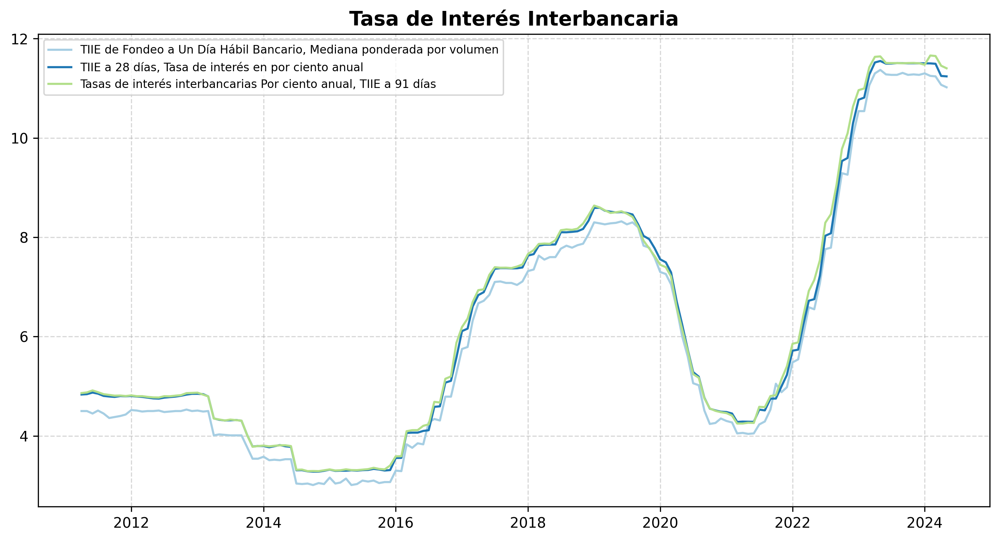

In [304]:
plot_fig(df1, "Tasa de Interés Interbancaria")

In [305]:
df2.columns

Index(['Sistemas de pago de bajo valor, Tarjetas de crédito, Tarjetas vigentes al cierre del trimestre (todas las marcas)',
       'Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), B',
       'Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), C',
       'Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), D',
       'Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), E',
       'Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), F',
       'Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), G',
       'Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), H',
       'Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), I',
       'Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), J',
       'Sistemas de pago de bajo valor, Tarjetas de crédito (todas las marcas), K',
       'Sistemas de pago de bajo val

In [306]:
df2.columns = df2.columns.str.replace("Sistemas de pago de bajo valor, Tarjetas de crédito", "")
df2.columns = df2.columns.str.replace(", ", " ")
df2.head()

,Tarjetas vigentes al cierre del trimestre (todas las marcas),(todas las marcas) B,(todas las marcas) C,(todas las marcas) D,(todas las marcas) E,(todas las marcas) F,(todas las marcas) G,(todas las marcas) H,(todas las marcas) I,(todas las marcas) J,(todas las marcas) K,(todas las marcas) L,(todas las marcas) M,(todas las marcas) N,(todas las marcas) O,(todas las marcas) P,(todas las marcas) Q,(todas las marcas) R,(todas las marcas) S,(todas las marcas) T,(todas las marcas) U,(todas las marcas) V,(todas las marcas) W,(todas las marcas) X,(todas las marcas) Y,Tarjetas vigentes al cierre del trimestre (mastercard),(mastercard) B,(mastercard) C,(mastercard) D,(mastercard) E,(mastercard) F,(mastercard) G,(mastercard) H,(mastercard) I,(mastercard) J,(mastercard) K,(mastercard) M,(mastercard) N,(mastercard) O,(mastercard) T,(mastercard) U,(mastercard) V,(mastercard) W,(mastercard) X,(mastercard) Y,Tarjetas vigentes al cierre del trimestre (visa),(visa) B,(visa) C,(visa) D,(visa) E,(visa) F,(visa) G,(visa) H,(visa) I,(visa) J,(visa) K,(visa) L,(visa) M,(visa) N,(visa) O,(visa) Q,(visa) R,(visa) S,(visa) T,(visa) U,Tarjetas vigentes al cierre del trimestre (otras marcas),(otras marcas) C,(otras marcas) E,(otras marcas) Q,(otras marcas) P,Tarjetas utilizadas durante el trimestre,Cuentas con tarjetas
2011-04,2.324182e+07,15638.0,5.804978e+06,8.242474e+06,2.931260e+06,1.109787e+06,17015.000000,198979.000000,377131.000000,1141.000000,411134.000000,21142.000000,81548.000000,24560.000000,1.852871e+06,700973.000000,4003.000000,0.0,30103.000000,0.0,1.341344e+06,75736.000000,0.0,0.0,0.0,8.908489e+06,6469.000000,4.172745e+06,900238.000000,2.718344e+06,223906.000000,0.0,22786.000000,0.0,0.0,321458.000000,0.0,18165.000000,448642.000000,0.0,0.0,75736.000000,0.0,0.0,0.0,1.302232e+07,9169.000000,1022219.0,7.342236e+06,212916.000000,885881.000000,17015.000000,176193.000000,377131.000000,1141.000000,89676.000000,21142.000000,81548.000000,6395.000000,1.404229e+06,3985.000000,0.0,30103.000000,0.0,1.341344e+06,1.311005e+06,610014.000000,0.0,18.0,700973.000000,15666938.0,1.180406e+07
2011-05,2.351398e+07,15552.0,5.944675e+06,8.231955e+06,2.971291e+06,1.130715e+06,17213.333333,205417.000000,374121.333333,1168.666667,420939.000000,21565.000000,79262.333333,23558.333333,1.875477e+06,706586.000000,3953.333333,0.0,28768.000000,0.0,1.387796e+06,73961.000000,0.0,0.0,0.0,9.039763e+06,6405.000000,4.269860e+06,896505.666667,2.747101e+06,222707.333333,0.0,23705.666667,0.0,0.0,332030.333333,0.0,17035.666667,450452.000000,0.0,0.0,73961.000000,0.0,0.0,0.0,1.314120e+07,9147.000000,1048409.0,7.335450e+06,224190.666667,908007.333333,17213.333333,181711.333333,374121.333333,1168.666667,88908.666667,21565.000000,79262.333333,6522.666667,1.425025e+06,3935.333333,0.0,28768.000000,0.0,1.387796e+06,1.333010e+06,626406.333333,0.0,18.0,706586.000000,15759413.0,1.183092e+07
2011-06,2.378613e+07,15466.0,6.084373e+06,8.221437e+06,3.011323e+06,1.151642e+06,17411.666667,211855.000000,371111.666667,1196.333333,430744.000000,21988.000000,76976.666667,22556.666667,1.898083e+06,712199.000000,3903.666667,0.0,27433.000000,0.0,1.434249e+06,72186.000000,0.0,0.0,0.0,9.171038e+06,6341.000000,4.366975e+06,892773.333333,2.775857e+06,221508.666667,0.0,24625.333333,0.0,0.0,342602.666667,0.0,15906.333333,452262.000000,0.0,0.0,72186.000000,0.0,0.0,0.0,1.326008e+07,9125.000000,1074599.0,7.328663e+06,235465.333333,930133.666667,17411.666667,187229.666667,371111.666667,1196.333333,88141.333333,21988.000000,76976.666667,6650.333333,1.445821e+06,3885.666667,0.0,27433.000000,0.0,1.434249e+06,1.355016e+06,642798.666667,0.0,18.0,712199.000000,15851888.0,1.185777e+07
2011-07,2.405829e+07,15380.0,6.224070e+06,8.210918e+06,3.051354e+06,1.172570e+06,17610.000000,218293.000000,368102.000000,1224.000000,440549.000000,22411.000000,74691.000000,21555.000000,1.920689e+06,717812.000000,3854.000000,0.0,26098.000000,0.0,1.480701e+06,70411.000000,0.0,0.0,0.0,9.302312e+06,6277.000000,4.464090e+06,889041.000000,2.804614e+

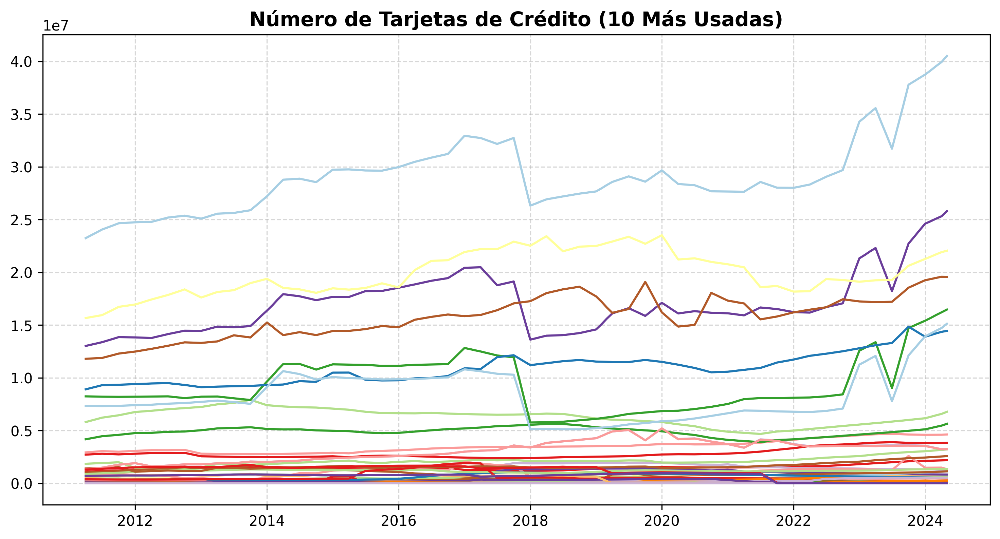

In [307]:
plot_fig(df2, "Número de Tarjetas de Crédito (10 Más Usadas)", legend = False)

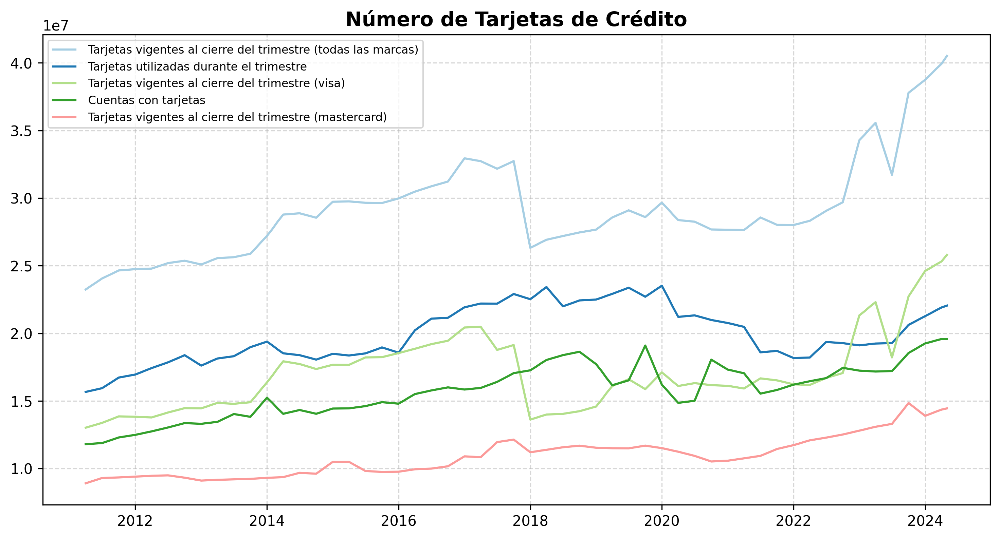

In [308]:
# keep the columns with the highest number of transactions
max_cols = df2.sum().nlargest(5).index
df2_max = df2[max_cols]

plot_fig(df2_max, "Número de Tarjetas de Crédito")

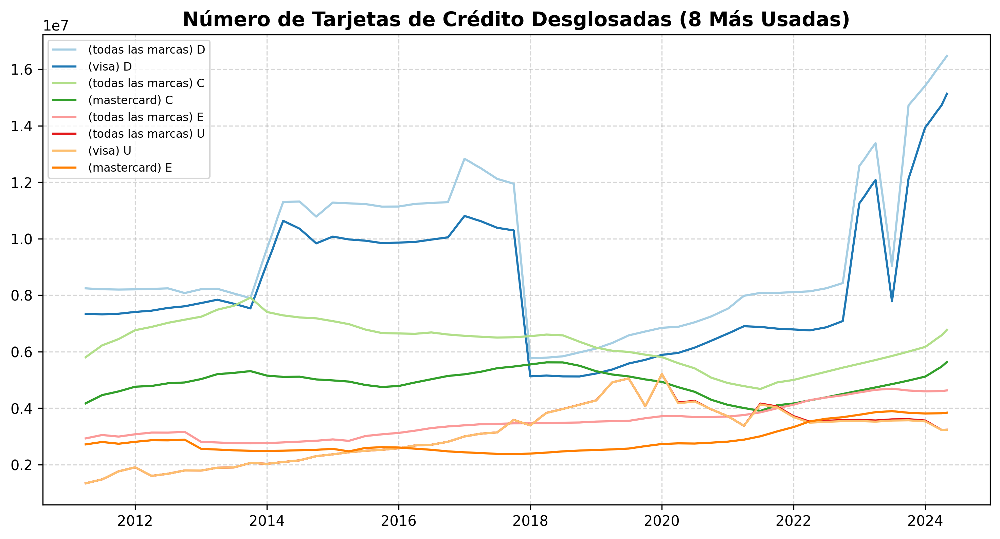

In [309]:
df2_min = df2.drop(max_cols, axis=1)
max_cols = df2_min.sum().nlargest(8).index
df2_win_max = df2[max_cols]

plot_fig(df2_win_max, "Número de Tarjetas de Crédito Desglosadas (8 Más Usadas)", legend = True)

In [310]:
df3.columns

Index(['TIIE a 28 días, Tasa de interés promedio mensual, en por ciento anual',
       'TIIE a 91 días, Tasa de interés promedio mensual, en por ciento anual',
       'TIIE a 182 días, Tasa de interés promedio mensual, en por ciento anual',
       'Fondeo promedio ponderado bancario, Tasa de interés promedio mensual, en por ciento anual',
       'Fondeo promedio ponderado gubernamental, Tasa de interés promedio mensual, en por ciento anual'],
      dtype='object', name=0)

In [311]:
df3.columns = df3.columns.str.replace(", Tasa de interés promedio mensual, en por ciento anual", "")

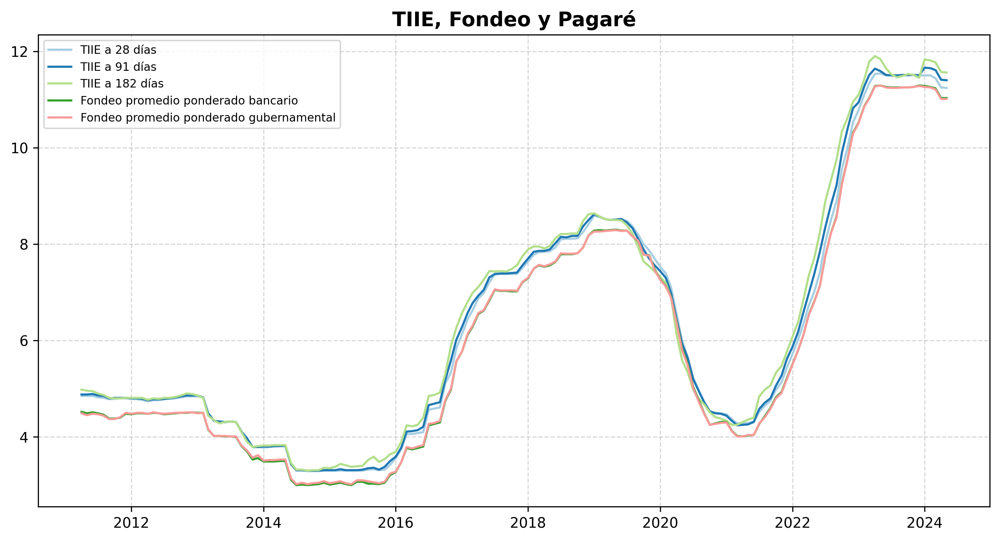

In [312]:
plot_fig(df3, "TIIE, Fondeo y Pagaré")

In [313]:
df4.columns

Index(['Tasa de efectiva promedio ponderada por saldo de todos los clientes con y sin promociones, Tarjetas de crédito',
       'Tasa de efectiva promedio ponderada por saldo de clientes no totaleros con y sin promociones, Tarjetas de crédito',
       'Tasa de efectiva promedio ponderada por saldo de clientes no totaleros sin promociones, Tarjetas de crédito'],
      dtype='object', name=0)

In [314]:
df4.columns = df4.columns.str.replace("Tasa de efectiva promedio ponderada por saldo de t", "T")
df4.columns = df4.columns.str.replace("Tasa de efectiva promedio ponderada por saldo de c", "C")
df4.columns = df4.columns.str.replace(", Tarjetas de crédito", "")


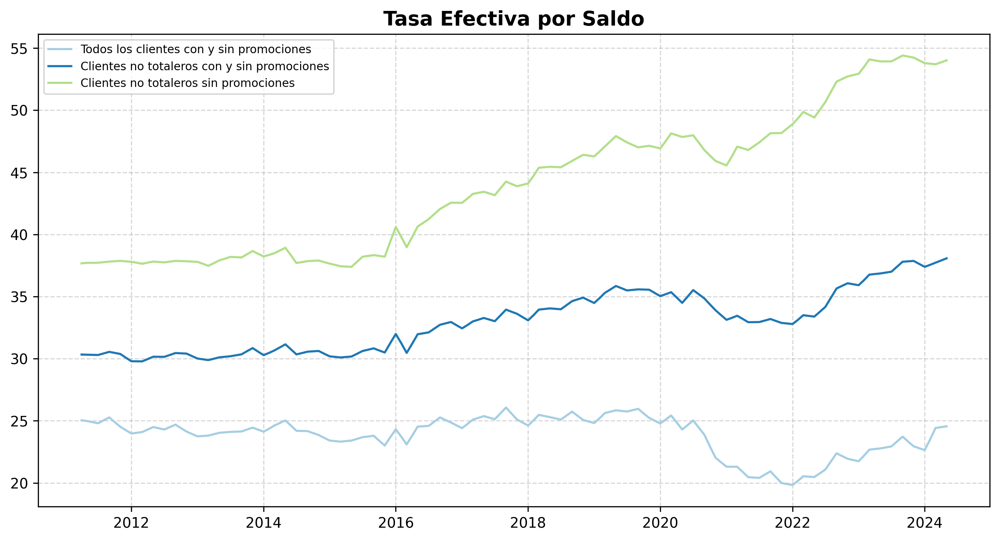

In [315]:
plot_fig(df4, "Tasa Efectiva por Saldo")

In [316]:
df5.columns 

Index(['Costo de captación a plazo de pasivos en moneda nacional (CCP), Tasa en por ciento anual',
       'Costo de captación a plazo de pasivos en moneda nacional observado (CCPO), Tasa en por ciento anual',
       'Costo de captación a plazo de pasivos en Udis (CCP-Udis), Tasa en por ciento anual',
       'Costo de captación a plazo de pasivos en dólares (CCP-Dólares), Tasa en por ciento anual',
       'Costo porcentual promedio (CPP), Tasa en por ciento anual',
       'Tasa de interés de los pasivos a plazo, Moneda nacional, Banca de Desarrollo'],
      dtype='object', name=0)

In [317]:
df5colnames = ["CCP", "CCPO", "CCP-Udis", "CCP-Dólares", "CPP", "Banca de Desarrollo"]

df5.columns = df5colnames

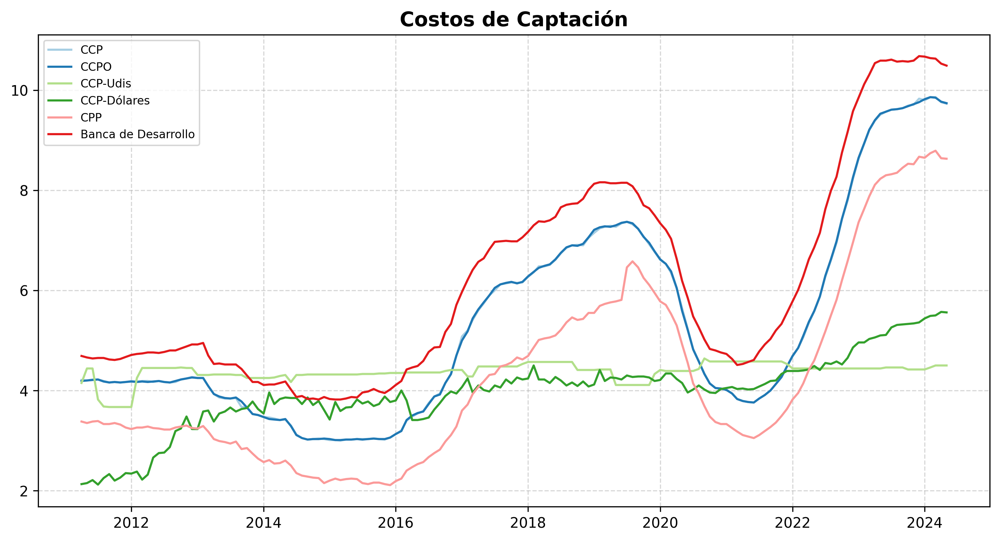

In [318]:
plot_fig(df5, "Costos de Captación")

In [319]:
df6.columns

Index(['Valores privados de corto plazo semanal, Total corto plazo, tasa promedio ponderada, Porcentajes', 'Valores privados de corto plazo semanal, Certificados bursátiles a corto plazo, tasa promedio ponderada, Porcentajes'], dtype='object', name=0)

In [320]:
df6.columns = df6.columns.str.replace("Valores privados de corto plazo semanal, ", "")
df6.columns = df6.columns.str.replace(", tasa promedio ponderada, Porcentajes", "")

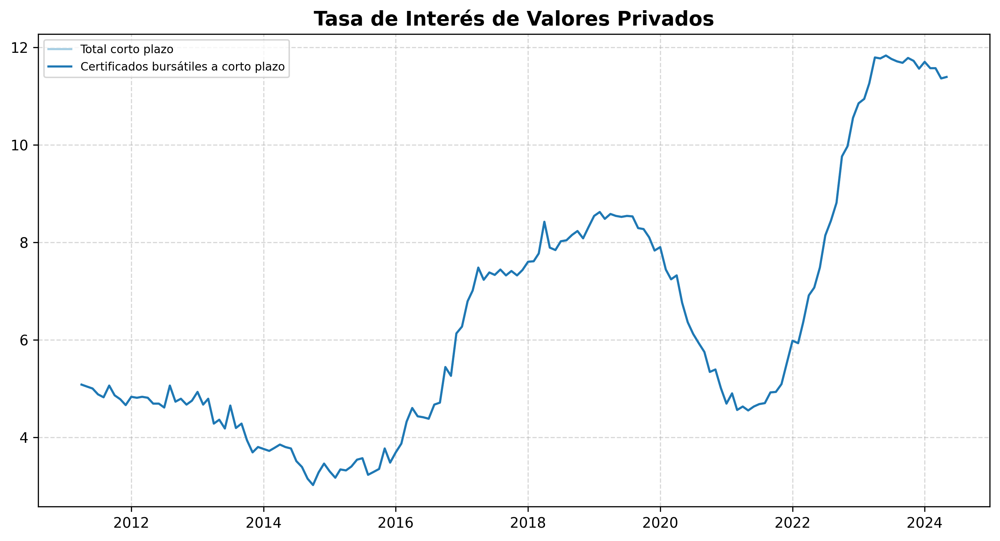

In [321]:
plot_fig(df6, "Tasa de Interés de Valores Privados")

In [322]:
df7.columns

Index(['Tasa de fondeo gubernamental, Mediana ponderada por volumen, Tasa de interés en por ciento anual', 'Tasa de fondeo ponderada con BPAS y BREMS.'], dtype='object', name=0)

In [323]:
df7.columns = df7.columns.str.replace(", Tasa de interés en por ciento anual", "")

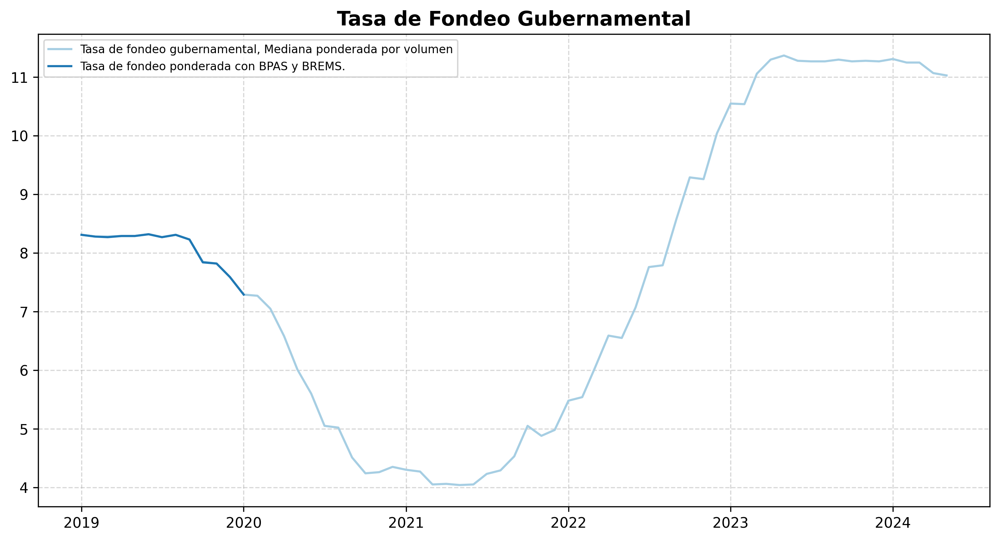

In [324]:
plot_fig(df7, "Tasa de Fondeo Gubernamental")

In [325]:
df8.columns

Index(['Vector de precios de títulos gubernamentales, Cetes 28 días - Plazo',
       'Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Limpio',
       'Vector de precios de títulos gubernamentales, Cetes 28 días - Precio Sucio',
       'Vector de precios de títulos gubernamentales, Cetes 28 días - Tasa Rendimiento',
       'Vector de precios de títulos gubernamentales, Cetes 91 días - Plazo',
       'Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Limpio',
       'Vector de precios de títulos gubernamentales, Cetes 91 días - Precio Sucio',
       'Vector de precios de títulos gubernamentales, Cetes 91 días - Tasa Rendimiento',
       'Vector de precios de títulos gubernamentales, Cetes 182 días - Plazo',
       'Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Limpio',
       'Vector de precios de títulos gubernamentales, Cetes 182 días - Precio Sucio',
       'Vector de precios de títulos gubernamentales, Cetes 182 días - T

In [326]:
df8.columns = df8.columns.str.replace("Vector de precios de títulos gubernamentales, ", "")

In [327]:
df8.columns 

Index(['Cetes 28 días - Plazo', 'Cetes 28 días - Precio Limpio',
       'Cetes 28 días - Precio Sucio', 'Cetes 28 días - Tasa Rendimiento',
       'Cetes 91 días - Plazo', 'Cetes 91 días - Precio Limpio',
       'Cetes 91 días - Precio Sucio', 'Cetes 91 días - Tasa Rendimiento',
       'Cetes 182 días - Plazo', 'Cetes 182 días - Precio Limpio',
       'Cetes 182 días - Precio Sucio', 'Cetes 182 días - Tasa Rendimiento',
       'Cetes 364 días - Plazo', 'Cetes 364 días - Precio Limpio',
       'Cetes 364 días - Precio Sucio', 'Cetes 364 días - Tasa Rendimiento',
       'Bonos 3 a 5 años - Plazo', 'Bonos 3 a 5 años - Precio Limpio',
       'Bonos 3 a 5 años - Precio Sucio', 'Bonos 3 a 5 años - Cupón Vigente',
       'Bonos 7 a 10 años - Plazo', 'Bonos 7 a 10 años - Precio Limpio',
       'Bonos 7 a 10 años - Precio Sucio', 'Bonos 7 a 10 años - Cupón Vigente',
       'Bonos 10 a 20 años - Plazo', 'Bonos 10 a 20 años - Precio Limpio',
       'Bonos 10 a 20 años - Precio Sucio',
       'Bon

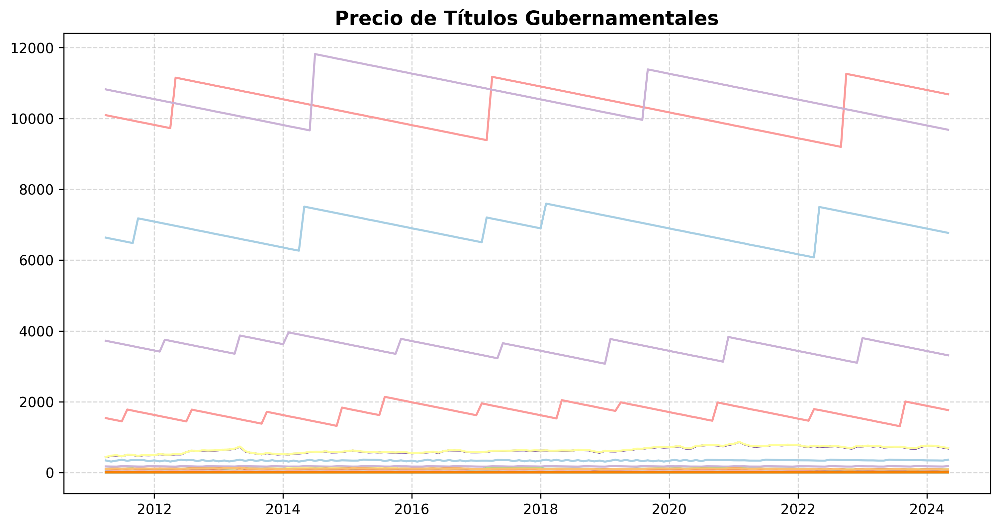

In [328]:
plot_fig(df8, "Precio de Títulos Gubernamentales", legend = False)

In [329]:
df9.columns

Index(['Índice de precios al consumidor, por objeto del gasto, Nacional, Índice general',
       'Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente',
       'Índice de precios al consumidor, por objeto del gasto, Nacional, Índice general',
       'Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente',
       'Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Mercancías',
       'Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Mercancías, Alimentos, Bebidas y Tabaco',
       'Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Mercancías, Mercancías no Alimenticias',
       'Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Servicios',
       'Subíndices subyacente y complementarios, Precios al consumidor (INPC), Subyacente, Servicios, Vivienda',
       'Subíndices subyacente y complementarios, Pr

In [330]:
df9.columns = df9.columns.str.replace("Subíndices subyacente y complementarios, Precios al consumidor (INPC), ", "SSC e INPC, ")


In [331]:
df9.columns

Index(['Índice de precios al consumidor, por objeto del gasto, Nacional, Índice general',
       'SSC e INPC, Subyacente',
       'Índice de precios al consumidor, por objeto del gasto, Nacional, Índice general',
       'SSC e INPC, Subyacente', 'SSC e INPC, Subyacente, Mercancías',
       'SSC e INPC, Subyacente, Mercancías, Alimentos, Bebidas y Tabaco',
       'SSC e INPC, Subyacente, Mercancías, Mercancías no Alimenticias',
       'SSC e INPC, Subyacente, Servicios',
       'SSC e INPC, Subyacente, Servicios, Vivienda',
       'SSC e INPC, Subyacente, Servicios, Educación (colegiaturas)',
       'SSC e INPC, Subyacente, Servicios, Otros Servicios',
       'SSC e INPC, No Subyacente', 'SSC e INPC, No Subyacente, Agropecuarios',
       'SSC e INPC, No Subyacente, Agropecuarios, Frutas y Verduras',
       'SSC e INPC, No Subyacente, Agropecuarios, Pecuarios',
       'SSC e INPC, No Subyacente, Energéticos y Tarifas Autorizadas por el Gobierno',
       'SSC e INPC, No Subyacente, Energé

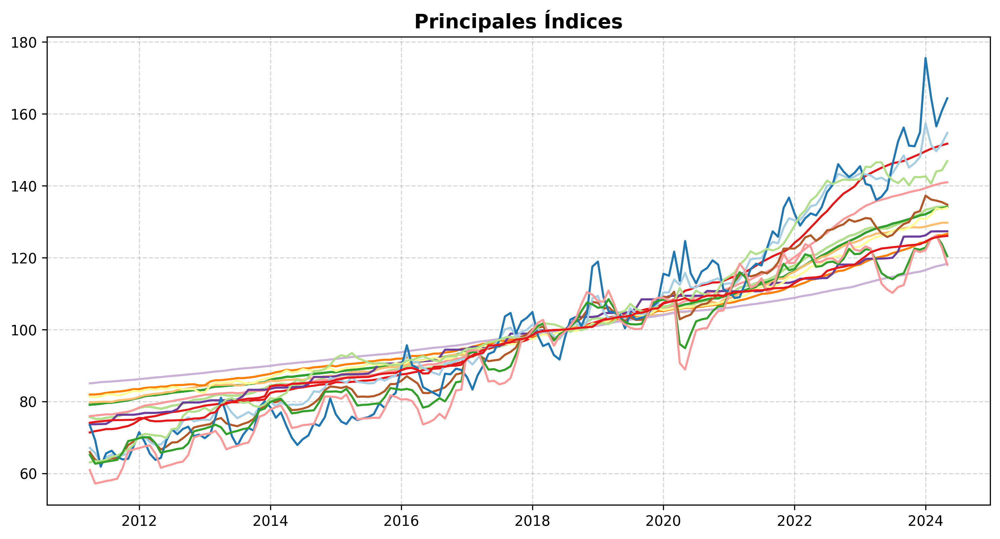

In [332]:
plot_fig(df9, "Principales Índices", legend = False)

In [333]:
df11.columns

Index(['TIIE de Fondeo a Un Día Hábil Bancario, Mediana ponderada por volumen',
       'Tasa de fondeo bancario, Mediana ponderada por volumen, Tasa de interés en por ciento anual',
       'Tasa de fondeo gubernamental, Mediana ponderada por volumen, Tasa de interés en por ciento anual',
       'TIIE a 28 días, Tasa de interés en por ciento anual',
       'Tasas de interés interbancarias Por ciento anual, TIIE a 91 días',
       'Tasa objetivo'],
      dtype='object', name=0)

In [334]:
df11.columns = df11.columns.str.replace(", Mediana ponderada por volumen", "")
df11.columns = df11.columns.str.replace(", Tasa de interés en por ciento anual", "")
df11.columns = df11.columns.str.replace("Tasas de interés interbancarias Por ciento anual, ", "")

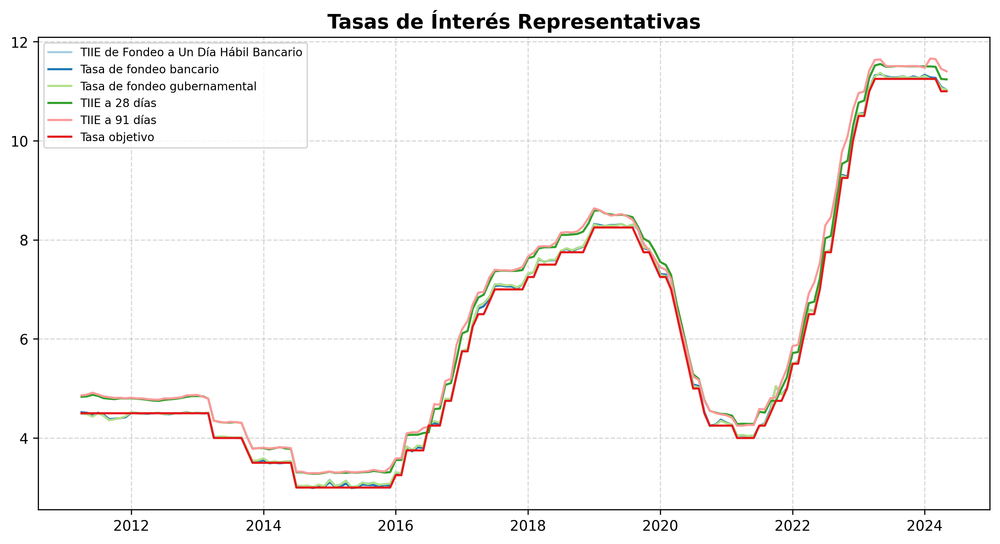

In [335]:
plot_fig(df11, "Tasas de Ínterés Representativas")

In [336]:
df12.columns

Index(['Índice Nacional de Precios al consumidor, Variación mensual',
       'Índice Nacional de Precios al consumidor, Variación acumulada',
       'Índice Nacional de Precios al consumidor, variación anual',
       'Inflación, Subyacente (nueva definición), Mensual',
       'Inflación, Subyacente (nueva definición), Acumulada en el año',
       'Inflación, Subyacente (nueva definición), Anual',
       'Inflación, No subyacente (nueva definición), Mensual',
       'Inflación, No subyacente (nueva definición), Acumulada en el año',
       'Inflación, No subyacente (nueva definición), Anual'],
      dtype='object', name=0)

In [337]:
df12.columns = df12.columns.str.replace(" (nueva definición)", "")
df12.columns = df12.columns.str.replace("Índice Nacional de Precios al consumidor", "INPC")

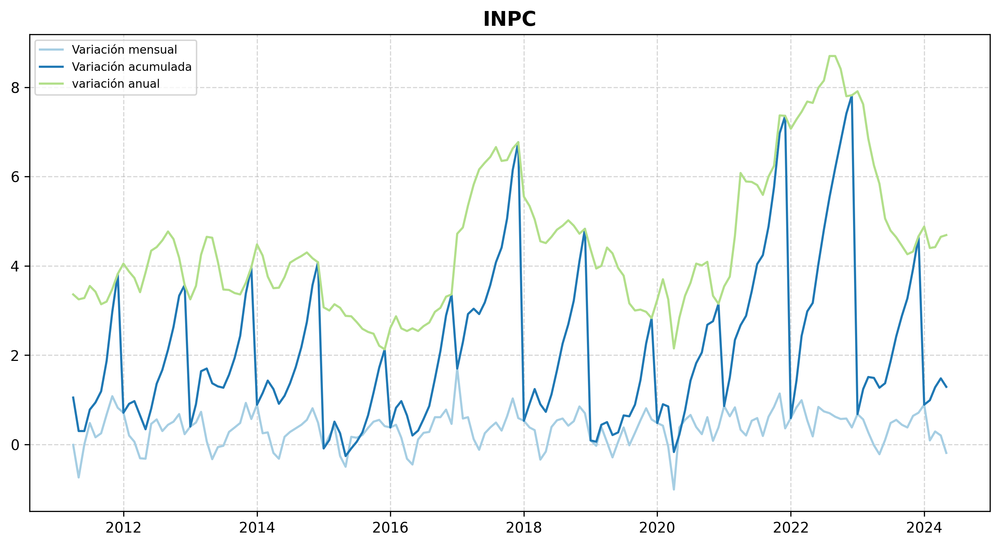

In [338]:
inpc = df12.iloc[:, 0:3]
inpc.columns = inpc.columns.str.replace("INPC, ", "")
plot_fig(inpc, "INPC")

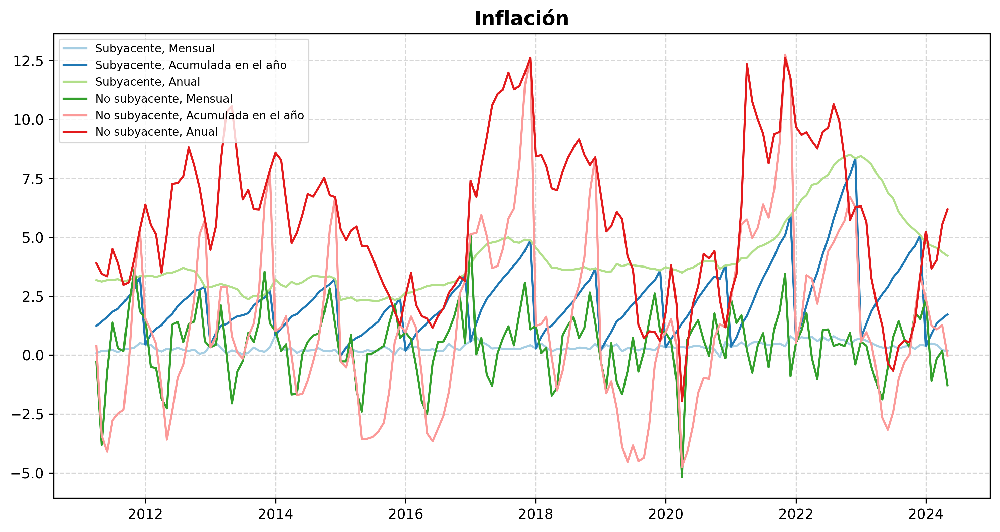

In [339]:
inflacion = df12.iloc[:, 3:]
inflacion.columns = inflacion.columns.str.replace("Inflación, ", "")
plot_fig(inflacion, "Inflación")

In [340]:
df15 = pd.read_excel("Datos\\Mas-Series\\15-ENOE.xlsx", index_col=0)

In [341]:
df15.index = pd.to_datetime(df15.index)
df15.index = df15.index.to_period("M")
df15 = df15.loc["2011-04":"2024-05"]
df15 = df15.apply(pd.to_numeric, errors='coerce')
df15

,Población ocupada por,Hasta un salario mínimo,Más de 1 hasta 2 salarios mínimos,Más de 2 hasta 3 salarios mínimos,Más de 3 hasta 5 salarios mínimos,Más de 5 salarios mínimos,No recibe ingresos 4,No especificado
Fecha,,,,,,,,
2011-04,45585827,18687108,14076735,3281261,1501317,608789,3349530,4081087
2011-05,46371759,19124881,14323290,3055363,1433776,642703,3663590,4128156
2011-06,46372692,18541704,13762688,3092693,1652765,582772,3859542,4880528
2011-07,46541073,19231826,13407872,2984082,1681487,665722,4096213,4473871
2011-08,46581948,19175211,13579849,3044008,1484555,639304,3803231,4855790
...,...,...,...,...,...,...,...,...
2023-10,59181377,20006647,19851691,5317458,2046167,774970,3073175,8111269
2023-11,59089006,19272596,19974874,5664928,2166479,763790,3054427,8191912
2023-12,59410486,20012777,20204942,5499896,2076671,781004,3093484,7741712


In [342]:
df16 = pd.read_excel("Datos\\Mas-Series\\16-Financiamiento-Bancario.xlsx")

In [343]:
df16 = clean_dataframe(df16)
df16

,Título,Financiamiento bancario y principales fuentes altern endeud sec privado del país Crédito al consumo
0,1994-10-01 00:00:00,51133
1,1995-01-01 00:00:00,0
2,1995-04-01 00:00:00,0
3,1995-07-01 00:00:00,0
4,1995-10-01 00:00:00,46988.6
...,...,...
115,2023-07-01 00:00:00,1739700
116,2023-10-01 00:00:00,1820174.5
117,2024-01-01 00:00:00,1850807.5
118,2024-04-01 00:00:00,1924944


In [344]:
df16 = clean_df(df16, do_interpolation=True)
df16

c:\Users\herie\AppData\Local\Programs\Python\Python312\Lib\site-packages\pandas\core\indexes\base.py:7588: FutureWarning: Dtype inference on a pandas object (Series, Index, ExtensionArray) is deprecated. The Index constructor will keep the original dtype in the future. Call `infer_objects` on the result to get the old behavior.
  return Index(sequences[0], name=names)


,Financiamiento bancario y principales fuentes altern endeud sec privado del país Crédito al consumo
2011-04,5.819358e+05
2011-05,5.924746e+05
2011-06,6.030135e+05
2011-07,6.135523e+05
2011-08,6.241612e+05
...,...
2024-01,1.850808e+06
2024-02,1.875520e+06
2024-03,1.900232e+06
2024-04,1.924944e+06


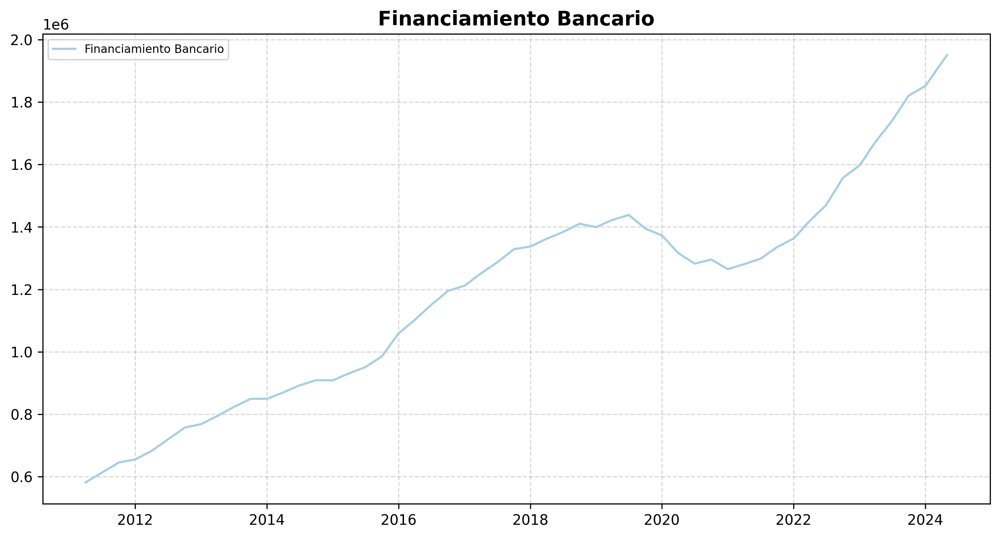

In [345]:
# change the name of the column
df16.columns = ["Financiamiento Bancario"]

plot_fig(df16, "Financiamiento Bancario")

In [346]:
df = pd.concat([df1, df2, df3, df4, df5, df6, df8, df9, df11, df12, df15, df16], axis=1)
df.head()
df.to_csv("Datos\\datos-nombres-bonitos.csv")

# Matriz de Corr

In [347]:
df2.columns

Index([' Tarjetas vigentes al cierre del trimestre (todas las marcas)',
       ' (todas las marcas) B', ' (todas las marcas) C',
       ' (todas las marcas) D', ' (todas las marcas) E',
       ' (todas las marcas) F', ' (todas las marcas) G',
       ' (todas las marcas) H', ' (todas las marcas) I',
       ' (todas las marcas) J', ' (todas las marcas) K',
       ' (todas las marcas) L', ' (todas las marcas) M',
       ' (todas las marcas) N', ' (todas las marcas) O',
       ' (todas las marcas) P', ' (todas las marcas) Q',
       ' (todas las marcas) R', ' (todas las marcas) S',
       ' (todas las marcas) T', ' (todas las marcas) U',
       ' (todas las marcas) V', ' (todas las marcas) W',
       ' (todas las marcas) X', ' (todas las marcas) Y',
       ' Tarjetas vigentes al cierre del trimestre (mastercard)',
       ' (mastercard) B', ' (mastercard) C', ' (mastercard) D',
       ' (mastercard) E', ' (mastercard) F', ' (mastercard) G',
       ' (mastercard) H', ' (mastercard) I', ' (ma

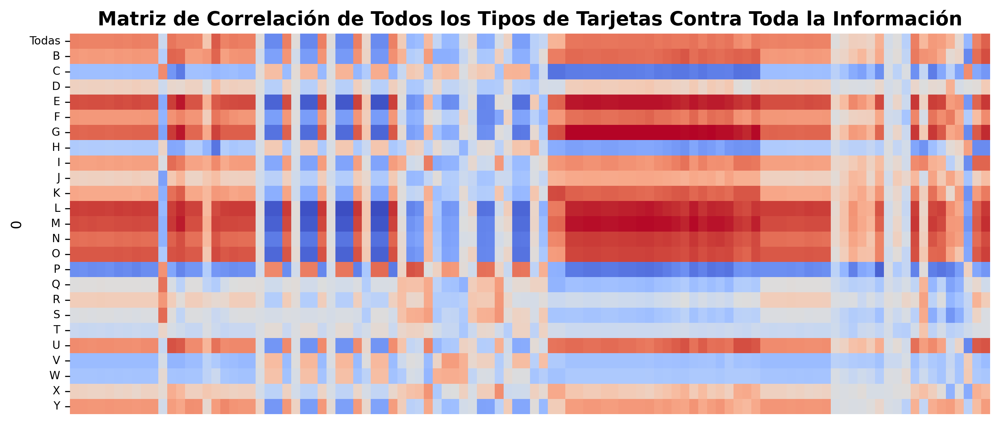

In [348]:
orig_todas_las_marcas = df2.columns[df2.columns.str.contains("todas las marcas")]
tdc = df2[orig_todas_las_marcas]
tdc_clean = tdc.copy()
tdc_clean.columns = tdc_clean.columns.str.replace("(todas las marcas) ", "")

# change the name of the first column
tdc_clean.rename(columns={tdc_clean.columns[0]: "Todas"}, inplace=True)

# Compute the correlation matrix
corr_matrix = df.corr()

# Get the df2 columns and the columns of the other dataframes
df2_cols = df2.columns
other_cols = [col for col in df.columns if col not in df2_cols]

# Extract the rectangular correlation matrix: rows from the original df2 columns matching "todas las marcas" and columns from the others
df2_corr_rect = corr_matrix.loc[orig_todas_las_marcas, other_cols]
df2_corr_rect.index = tdc_clean.columns

# Plot the correlation matrix without labels and numbers
plt.figure(figsize=(12, 5), dpi=300)
sns.heatmap(df2_corr_rect, annot=False, cmap='coolwarm', xticklabels=False, cbar=False)
plt.title("Matriz de Correlación de Todos los Tipos de Tarjetas Contra Toda la Información", fontsize=14, fontweight='bold')
plt.yticks(fontsize=8)
plt.savefig("Datos\\SVG\\Correlación de Todas las Tarjetas.svg")
plt.show()

0
 M       45.151685
 E       44.552001
 L       44.392735
 G       44.326678
 O       40.110897
 N       39.180207
 U       35.742081
 K       33.220751
 B       32.795793
Todas    32.074615
 I       29.692473
 F       28.936593
 Y       24.149913
 J       15.711265
 X       15.525237
 D        8.021563
 R        6.312386
 T       -4.959898
 S       -4.986840
 Q       -6.772187
 W      -14.720265
 V      -16.630139
 H      -21.858553
 C      -28.427704
 P      -31.207750
dtype: float64


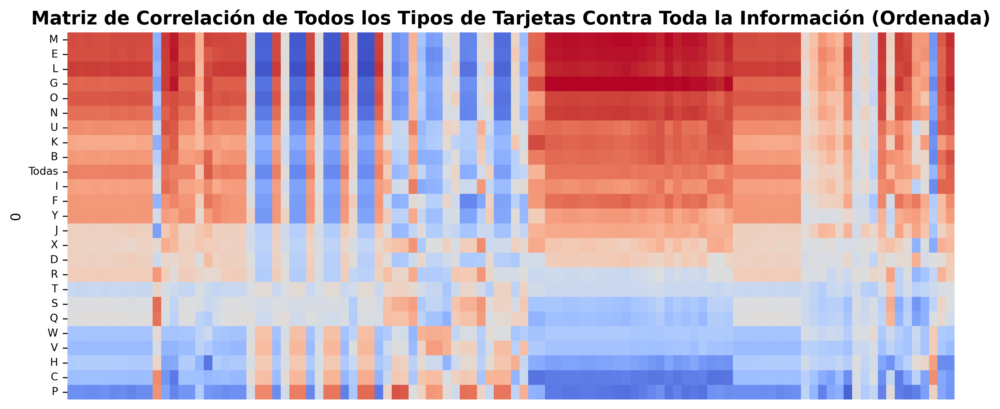

In [349]:
row_sums = df2_corr_rect.sum(axis=1).sort_values(ascending=False)
print(row_sums)

# Plot the correlation matrix ordered by row sums
plt.figure(figsize=(12, 5), dpi=300)
sns.heatmap(df2_corr_rect.loc[row_sums.index], annot=False, cmap='coolwarm', xticklabels=False, cbar=False)
plt.title("Matriz de Correlación de Todos los Tipos de Tarjetas Contra Toda la Información (Ordenada)", fontsize=14, fontweight='bold')
plt.yticks(fontsize=8)
plt.savefig("Datos\\SVG\\Correlación de Todas las Tarjetas Ordenada.svg")
plt.show()

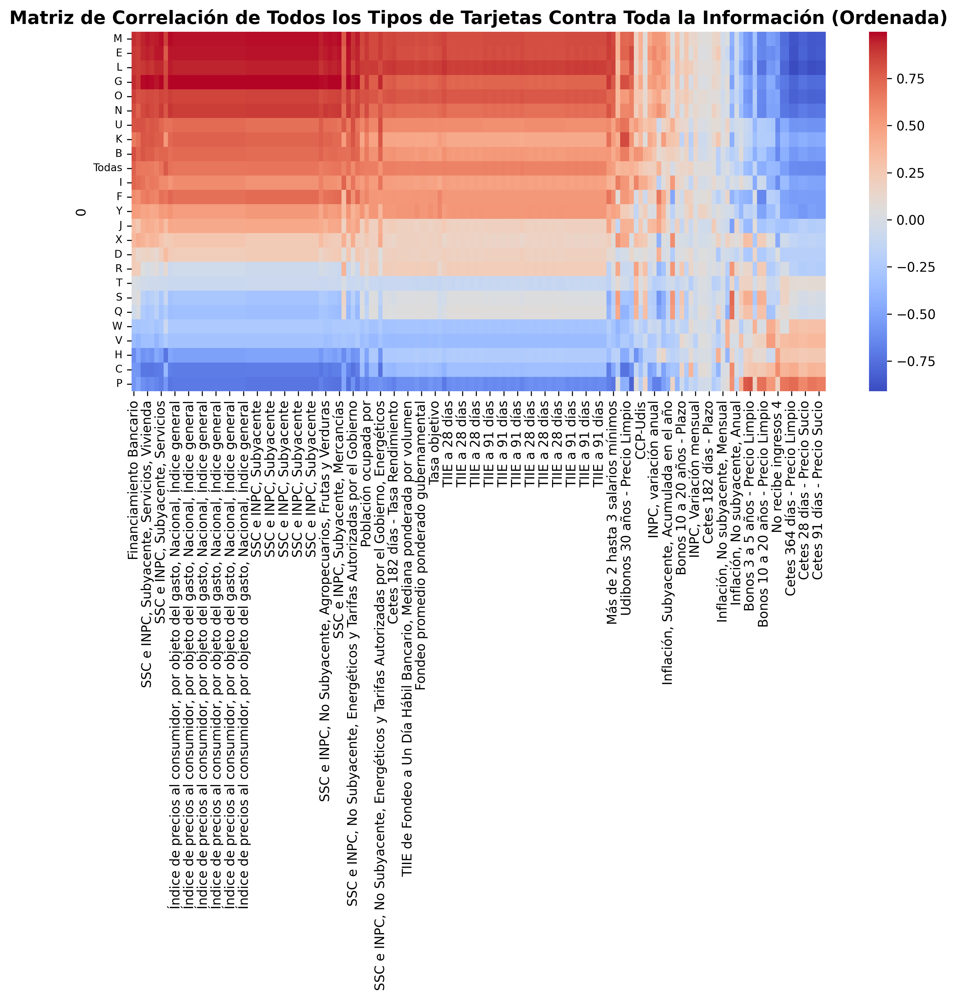

In [350]:
# Sum the correlations for rows and columns
row_sums = df2_corr_rect.sum(axis=1).sort_values(ascending=False)
col_sums = df2_corr_rect.sum(axis=0).sort_values(ascending=False)

# Order the correlation matrix by row and column sums
ordered_corr_matrix = df2_corr_rect.loc[row_sums.index, col_sums.index]

# Plot the ordered correlation matrix
plt.figure(figsize=(12, 5), dpi=300)
sns.heatmap(ordered_corr_matrix, annot=False, cmap='coolwarm')
plt.title("Matriz de Correlación de Todos los Tipos de Tarjetas Contra Toda la Información (Ordenada)", fontsize=14, fontweight='bold')
plt.yticks(fontsize=8)
plt.savefig("Datos\\SVG\\Correlación de Todas las Tarjetas Ordenada por Filas y Columnas 3.svg")
plt.show()

# info de las tdc

In [351]:
df2

,Tarjetas vigentes al cierre del trimestre (todas las marcas),(todas las marcas) B,(todas las marcas) C,(todas las marcas) D,(todas las marcas) E,(todas las marcas) F,(todas las marcas) G,(todas las marcas) H,(todas las marcas) I,(todas las marcas) J,(todas las marcas) K,(todas las marcas) L,(todas las marcas) M,(todas las marcas) N,(todas las marcas) O,(todas las marcas) P,(todas las marcas) Q,(todas las marcas) R,(todas las marcas) S,(todas las marcas) T,(todas las marcas) U,(todas las marcas) V,(todas las marcas) W,(todas las marcas) X,(todas las marcas) Y,Tarjetas vigentes al cierre del trimestre (mastercard),(mastercard) B,(mastercard) C,(mastercard) D,(mastercard) E,(mastercard) F,(mastercard) G,(mastercard) H,(mastercard) I,(mastercard) J,(mastercard) K,(mastercard) M,(mastercard) N,(mastercard) O,(mastercard) T,(mastercard) U,(mastercard) V,(mastercard) W,(mastercard) X,(mastercard) Y,Tarjetas vigentes al cierre del trimestre (visa),(visa) B,(visa) C,(visa) D,(visa) E,(visa) F,(visa) G,(visa) H,(visa) I,(visa) J,(visa) K,(visa) L,(visa) M,(visa) N,(visa) O,(visa) Q,(visa) R,(visa) S,(visa) T,(visa) U,Tarjetas vigentes al cierre del trimestre (otras marcas),(otras marcas) C,(otras marcas) E,(otras marcas) Q,(otras marcas) P,Tarjetas utilizadas durante el trimestre,Cuentas con tarjetas
2011-04,2.324182e+07,15638.0,5.804978e+06,8.242474e+06,2.931260e+06,1.109787e+06,17015.000000,198979.000000,3.771310e+05,1141.000000,411134.000000,21142.000000,8.154800e+04,24560.000000,1.852871e+06,700973.000000,4003.000000,0.0,30103.000000,0.0,1.341344e+06,75736.000000,0.0,0.0,0.0,8.908489e+06,6469.000000,4.172745e+06,9.002380e+05,2.718344e+06,223906.000000,0.0,22786.000000,0.000000,0.000000,321458.000000,0.000000e+00,18165.000000,448642.000000,0.0,0.000000,75736.000000,0.0,0.0,0.0,1.302232e+07,9169.000000,1.022219e+06,7.342236e+06,212916.000000,8.858810e+05,17015.000000,176193.000000,377131.000000,1141.000000,89676.000000,21142.000000,81548.000000,6395.000000,1.404229e+06,3985.000000,0.0,30103.000000,0.0,1.341344e+06,1.311005e+06,610014.000000,0.000000,18.0,700973.000000,1.566694e+07,1.180406e+07
2011-05,2.351398e+07,15552.0,5.944675e+06,8.231955e+06,2.971291e+06,1.130715e+06,17213.333333,205417.000000,3.741213e+05,1168.666667,420939.000000,21565.000000,7.926233e+04,23558.333333,1.875477e+06,706586.000000,3953.333333,0.0,28768.000000,0.0,1.387796e+06,73961.000000,0.0,0.0,0.0,9.039763e+06,6405.000000,4.269860e+06,8.965057e+05,2.747101e+06,222707.333333,0.0,23705.666667,0.000000,0.000000,332030.333333,0.000000e+00,17035.666667,450452.000000,0.0,0.000000,73961.000000,0.0,0.0,0.0,1.314120e+07,9147.000000,1.048409e+06,7.335450e+06,224190.666667,9.080073e+05,17213.333333,181711.333333,374121.333333,1168.666667,88908.666667,21565.000000,79262.333333,6522.666667,1.425025e+06,3935.333333,0.0,28768.000000,0.0,1.387796e+06,1.333010e+06,626406.333333,0.000000,18.0,706586.000000,1.575941e+07,1.183092e+07
2011-06,2.378613e+07,15466.0,6.084373e+06,8.221437e+06,3.011323e+06,1.151642e+06,17411.666667,211855.000000,3.711117e+05,1196.333333,430744.000000,21988.000000,7.697667e+04,22556.666667,1.898083e+06,712199.000000,3903.666667,0.0,27433.000000,0.0,1.434249e+06,72186.000000,0.0,0.0,0.0,9.171038e+06,6341.000000,4.366975e+06,8.927733e+05,2.775857e+06,221508.666667,0.0,24625.333333,0.000000,0.000000,342602.666667,0.000000e+00,15906.333333,452262.000000,0.0,0.000000,72186.000000,0.0,0.0,0.0,1.326008e+07,9125.000000,1.074599e+06,7.328663e+06,235465.333333,9.301337e+05,17411.666667,187229.666667,371111.666667,1196.333333,88141.333333,21988.000000,76976.666667,6650.333333,1.445821e+06,3885.666667,0.0,27433.000000,0.0,1.434249e+06,1.355016e+06,642798.666667,0.000000,18.0,712199.000000,1.585189e+07,1.185777e+07
2011-07,2.405829e+07,15380.0,6.224070e+06,8.210918e+06,3.051354e+06,1.172570e+06,17610.000000,218293.000000,3.681020e+05,1224.000000,440549.000000,22411.000000,7.469100e+04,21555.000000,1.920689e+06,717812.000000,3854.000000,0.0,26098.000000,0.0,1.480701

In [352]:
tdc_clean.head()

,Todas,B,C,D,E,F,G,H,I,J,K,L,M,N,O,P,Q,R,S,T,U,V,W,X,Y
2011-04,2.324182e+07,15638.0,5.804978e+06,8.242474e+06,2.931260e+06,1.109787e+06,17015.000000,198979.000000,377131.000000,1141.000000,411134.000000,21142.000000,81548.000000,24560.000000,1.852871e+06,700973.000000,4003.000000,0.0,30103.000000,0.0,1.341344e+06,75736.000000,0.0,0.0,0.0
2011-05,2.351398e+07,15552.0,5.944675e+06,8.231955e+06,2.971291e+06,1.130715e+06,17213.333333,205417.000000,374121.333333,1168.666667,420939.000000,21565.000000,79262.333333,23558.333333,1.875477e+06,706586.000000,3953.333333,0.0,28768.000000,0.0,1.387796e+06,73961.000000,0.0,0.0,0.0
2011-06,2.378613e+07,15466.0,6.084373e+06,8.221437e+06,3.011323e+06,1.151642e+06,17411.666667,211855.000000,371111.666667,1196.333333,430744.000000,21988.000000,76976.666667,22556.666667,1.898083e+06,712199.000000,3903.666667,0.0,27433.000000,0.0,1.434249e+06,72186.000000,0.0,0.0,0.0
2011-07,2.405829e+07,15380.0,6.224070e+06,8.210918e+06,3.051354e+06,1.172570e+06,17610.000000,218293.000000,368102.000000,1224.000000,440549.000000,22411.000000,74691.000000,21555.000000,1.920689e+06,717812.000000,3854.000000,0.0,26098.000000,0.0,1.480701e+06,70411.000000,0.0,0.0,0.0
2011-08,2.425563e+07,15230.0,6.298939e+06,8.207284e+06,3.032766e+06,1.188782e+06,17747.666667,222550.666667,365889.000000,1244.333333,442583.333333,22811.333333,73700.666667,21807.000000,1.945552e+06,725623.333333,3616.333333,0.0,25000.666667,0.0,1.575749e+06,68752.666667,0.0,0.0,0.0


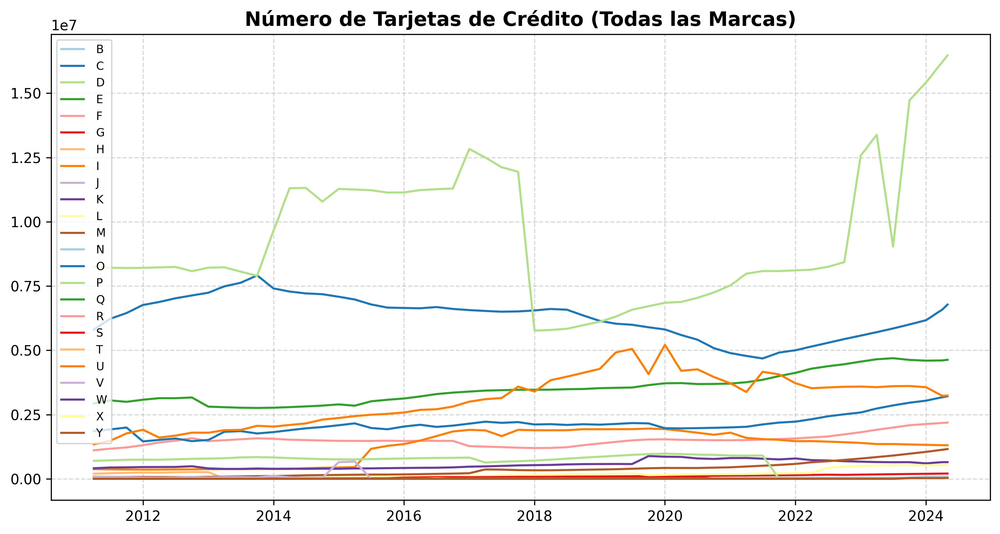

In [353]:
# quitar la columna que se llama todas
tdc_clean = tdc_clean.drop("Todas", axis=1)
plot_fig(tdc_clean, "Número de Tarjetas de Crédito (Todas las Marcas)", legend=True)

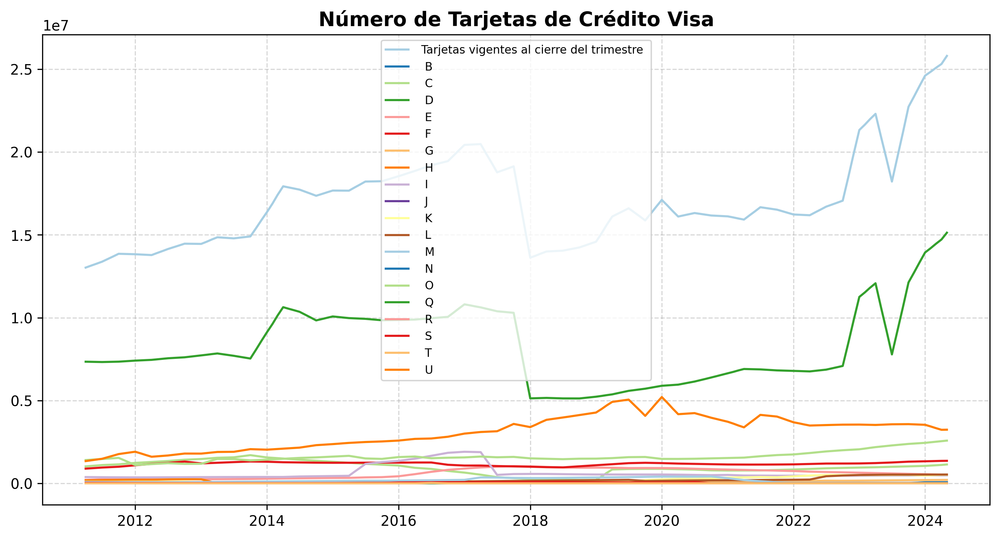

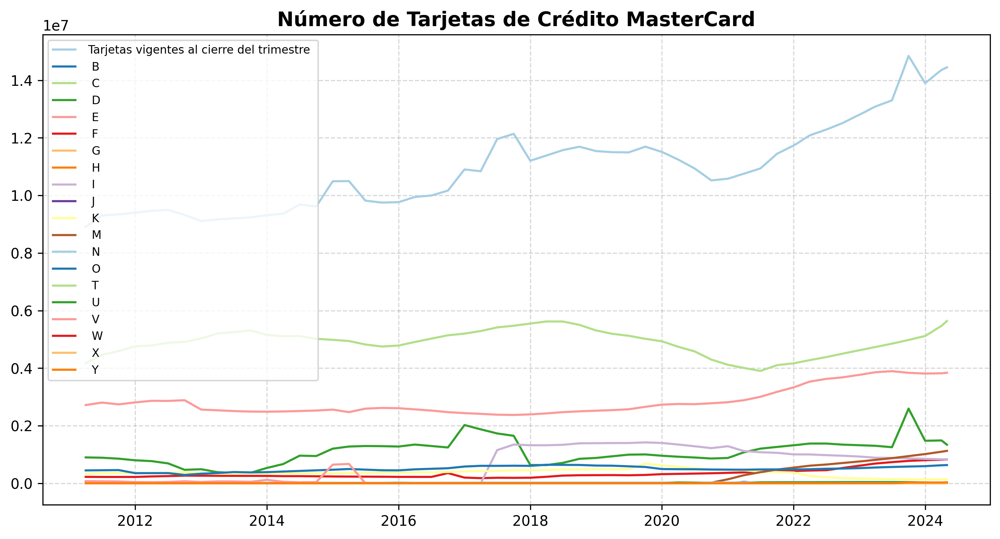

In [354]:
# comparar numero de visas y mastercards
visa = df2.columns[df2.columns.str.contains("visa")]
mastercard = df2.columns[df2.columns.str.contains("mastercard")]

visa_df = df2[visa]
mastercard_df = df2[mastercard]

visa_df.columns = visa_df.columns.str.replace("(visa)", "")
mastercard_df.columns = mastercard_df.columns.str.replace("(mastercard)", "")

plot_fig(visa_df, "Número de Tarjetas de Crédito Visa", legend=True)
plot_fig(mastercard_df, "Número de Tarjetas de Crédito MasterCard", legend=True)

# Muchas se correlacionan mucho, entonces vamos a ver con cuales nos quedamos

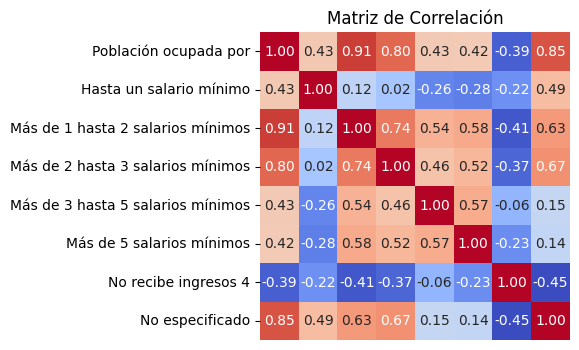

In [355]:
# correlation matrix
corr = df15.corr()
plt.figure(figsize=(4, 4))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", xticklabels=False, cbar=False)
plt.title("Matriz de Correlación")
plt.show()

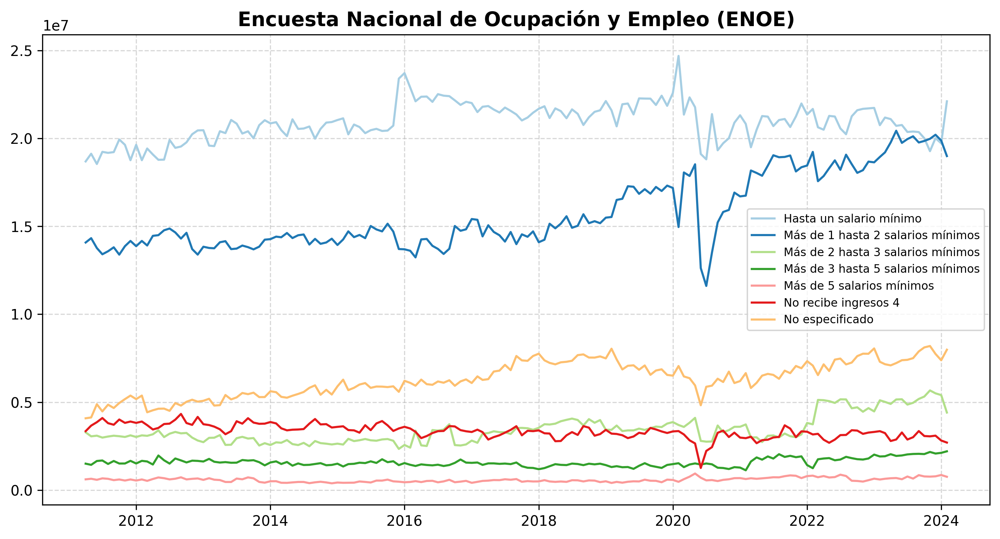

In [356]:
df15_filtered = df15.loc[:, ~df15.columns.str.contains("Población ocupada por")]
plot_fig(df15_filtered, "Encuesta Nacional de Ocupación y Empleo (ENOE)")

dejamos todas

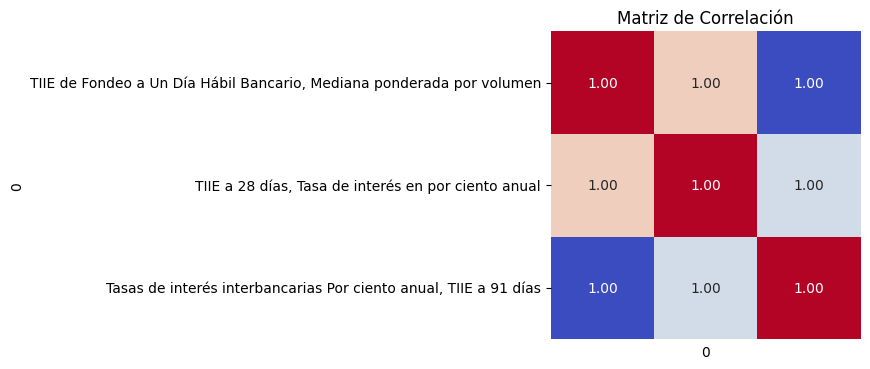

In [357]:
# correlation matrix
corr = df1.corr()
plt.figure(figsize=(4, 4))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", xticklabels=False, cbar=False)
plt.title("Matriz de Correlación")
plt.show()

nos quedamos con la TTIE a 28 dias

In [358]:
df1 = df1["TIIE a 28 días, Tasa de interés en por ciento anual"]

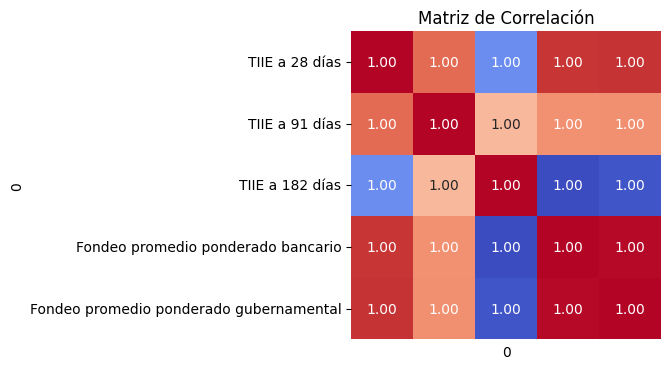

In [359]:
# correlation matrix
corr = df3.corr()
plt.figure(figsize=(4, 4))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", xticklabels=False, cbar=False)

plt.title("Matriz de Correlación")
plt.show()

nos quedamos con la TTIE a 28 dias

In [360]:
df3 = df3["Fondeo promedio ponderado bancario"]

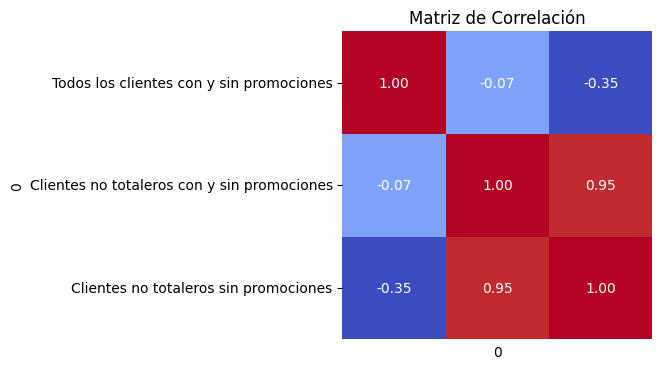

In [361]:
# correlation matrix
corr = df4.corr()
plt.figure(figsize=(4, 4))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", xticklabels=False, cbar=False)
plt.title("Matriz de Correlación")
plt.show()

nos quedamos con todas

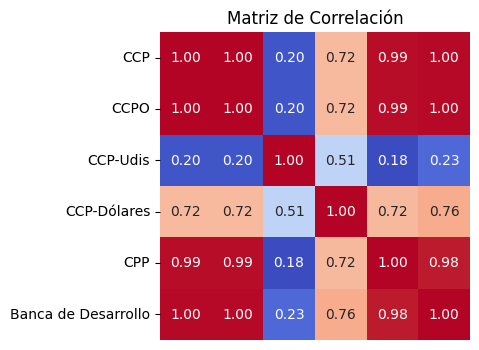

In [362]:
# correlation matrix
corr = df5.corr()
plt.figure(figsize=(4, 4))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", xticklabels=False, cbar=False)
plt.title("Matriz de Correlación")
plt.show()

cpp, cpp-udis, cpp dolares

In [363]:
# Col 0, 2, 3
df5 = df5.iloc[:, [0, 2, 3]]

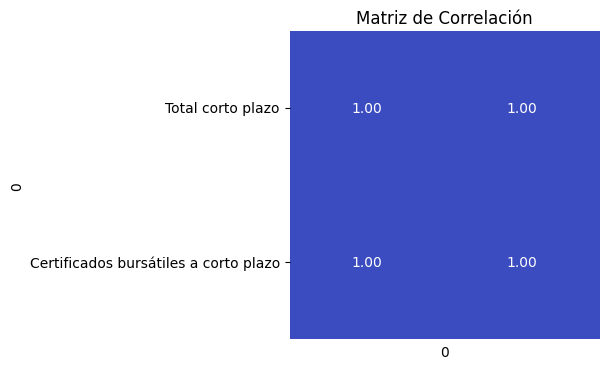

In [364]:
# correlation matrix
corr = df6.corr()
plt.figure(figsize=(4, 4))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", xticklabels=False, cbar=False)
plt.title("Matriz de Correlación")
plt.show()

total corto plazo

In [365]:
df6.count()

0
Total corto plazo                        158
Certificados bursátiles a corto plazo    158
dtype: int64

In [366]:
df6 = df6["Certificados bursátiles a corto plazo"]

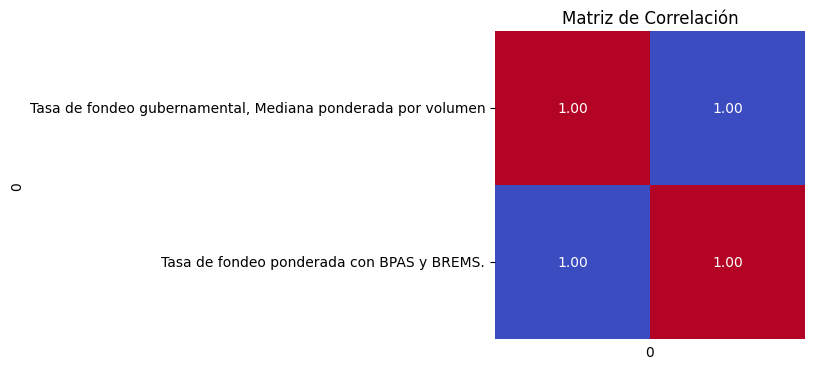

In [367]:
# correlation matrix
corr = df7.corr()
plt.figure(figsize=(4, 4))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", xticklabels=False, cbar=False)
plt.title("Matriz de Correlación")
plt.show()

jajaa las dos

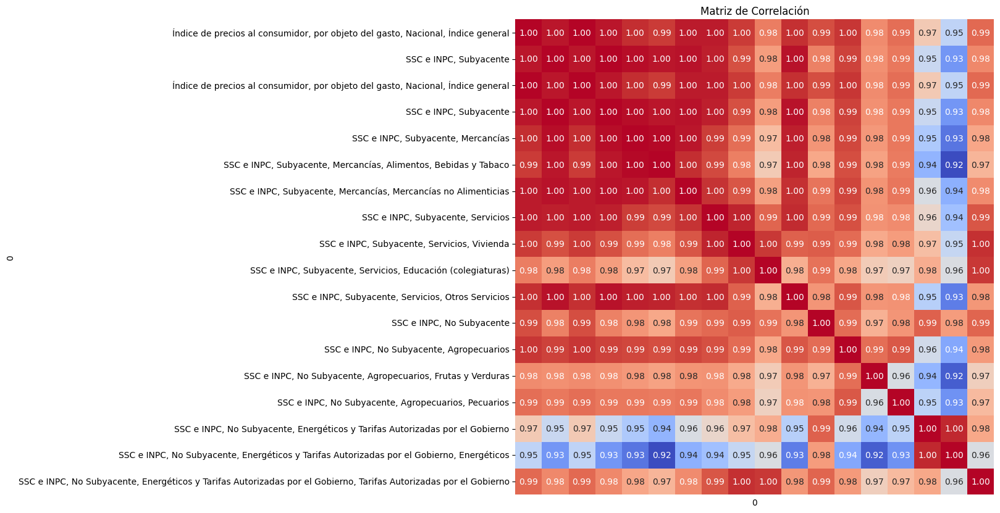

In [368]:
# correlation matrix
corr = df9.corr()
plt.figure(figsize=(10, 10))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", xticklabels=False, cbar=False)
plt.title("Matriz de Correlación")
plt.savefig("Datos\\SVG\\Correlación de Todas las Tarjetas Ordenada por Filas y Columnas uoeuoaeu.svg")
plt.show()

In [369]:
df9 = df9.iloc[:, [0, 15, 16]]

inpc1, sse e inpc penultimo

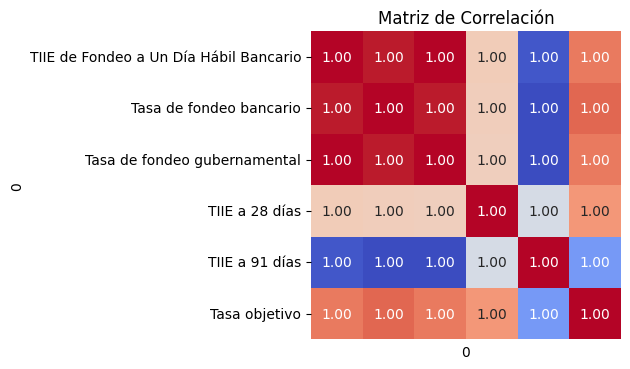

In [370]:
# correlation matrix
corr = df11.corr()
plt.figure(figsize=(4, 4))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", xticklabels=False, cbar=False)
plt.title("Matriz de Correlación")
plt.show()

In [371]:
df11 = df11.iloc[:, -1]

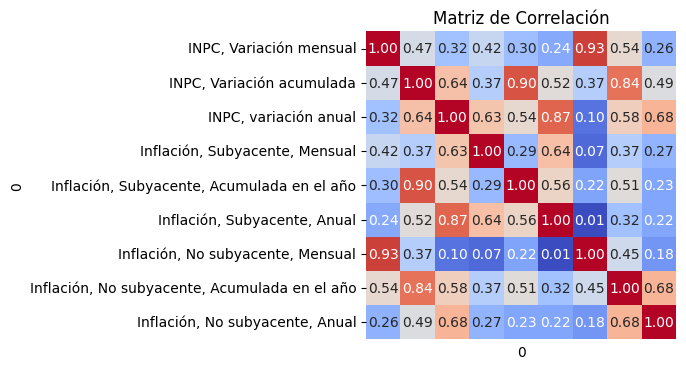

In [372]:
# correlation matrix
corr = df12.corr()
plt.figure(figsize=(4, 4))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", xticklabels=False, cbar=False)
plt.title("Matriz de Correlación")
plt.show()

todos

In [373]:
dffinal = pd.concat([df2, df1, df3, df4, df5, df6, df8, df9, df11, df12, df15, df16], axis=1)
dffinal.head()

,Tarjetas vigentes al cierre del trimestre (todas las marcas),(todas las marcas) B,(todas las marcas) C,(todas las marcas) D,(todas las marcas) E,(todas las marcas) F,(todas las marcas) G,(todas las marcas) H,(todas las marcas) I,(todas las marcas) J,(todas las marcas) K,(todas las marcas) L,(todas las marcas) M,(todas las marcas) N,(todas las marcas) O,(todas las marcas) P,(todas las marcas) Q,(todas las marcas) R,(todas las marcas) S,(todas las marcas) T,(todas las marcas) U,(todas las marcas) V,(todas las marcas) W,(todas las marcas) X,(todas las marcas) Y,Tarjetas vigentes al cierre del trimestre (mastercard),(mastercard) B,(mastercard) C,(mastercard) D,(mastercard) E,(mastercard) F,(mastercard) G,(mastercard) H,(mastercard) I,(mastercard) J,(mastercard) K,(mastercard) M,(mastercard) N,(mastercard) O,(mastercard) T,(mastercard) U,(mastercard) V,(mastercard) W,(mastercard) X,(mastercard) Y,Tarjetas vigentes al cierre del trimestre (visa),(visa) B,(visa) C,(visa) D,(visa) E,(visa) F,(visa) G,(visa) H,(visa) I,(visa) J,(visa) K,(visa) L,(visa) M,(visa) N,(visa) O,(visa) Q,(visa) R,(visa) S,(visa) T,(visa) U,Tarjetas vigentes al cierre del trimestre (otras marcas),(otras marcas) C,(otras marcas) E,(otras marcas) Q,(otras marcas) P,Tarjetas utilizadas durante el trimestre,Cuentas con tarjetas,"TIIE a 28 días, Tasa de interés en por ciento anual",Fondeo promedio ponderado bancario,Todos los clientes con y sin promociones,Clientes no totaleros con y sin promociones,Clientes no totaleros sin promociones,CCP,CCP-Udis,CCP-Dólares,Certificados bursátiles a corto plazo,Cetes 28 días - Plazo,Cetes 28 días - Precio Limpio,Cetes 28 días - Precio Sucio,Cetes 28 días - Tasa Rendimiento,Cetes 91 días - Plazo,Cetes 91 días - Precio Limpio,Cetes 91 días - Precio Sucio,Cetes 91 días - Tasa Rendimiento,Cetes 182 días - Plazo,Cetes 182 días - Precio Limpio,Cetes 182 días - Precio Sucio,Cetes 182 días - Tasa Rendimiento,Cetes 364 días - Plazo,Cetes 364 días - Precio Limpio,Cetes 364 días - Precio Sucio,Cetes 364 días - Tasa Rendimiento,Bonos 3 a 5 años - Plazo,Bonos 3 a 5 años - Precio Limpio,Bonos 3 a 5 años - Precio Sucio,Bonos 3 a 5 años - Cupón Vigente,Bonos 7 a 10 años - Plazo,Bonos 7 a 10 años - Precio Limpio,Bonos 7 a 10 años - Precio Sucio,Bonos 7 a 10 años - Cupón Vigente,Bonos 10 a 20 años - Plazo,Bonos 10 a 20 años - Precio Limpio,Bonos 10 a 20 años - Precio Sucio,Bonos 10 a 20 años - Cupón Vigente,Bonos 20 a 30 años - Plazo,Bonos 20 a 30 años - Precio Limpio,Bonos 20 a 30 años - Precio Sucio,Bonos 20 a 30 años - Cupón Vigente,Udibonos 30 años - Plazo,Udibonos 30 años - Precio Limpio,Udibonos 30 años - Precio Sucio,"Índice de precios al consumidor, por objeto del gasto, Nacional, Índice general","SSC e INPC, No Subyacente, Energéticos y Tarifas Autorizadas por el Gobierno","SSC e INPC, No Subyacente, Energéticos y Tarifas Autorizadas por el Gobierno, Energéticos",Tasa objetivo,"INPC, Variación mensual","INPC, Variación acumulada","INPC, variación anual","Inflación, Subyacente, Mensual","Inflación, Subyacente, Acumulada en el año","Inflación, Subyacente, Anual","Inflación, No subyacente, Mensual","Inflación, No subyacente, Acumulada en el año","Inflación, No subyacente, Anual",Población ocupada por,Hasta un salario mínimo,Más de 1 hasta 2 salarios mínimos,Más de 2 hasta 3 salarios mínimos,Más de 3 hasta 5 salarios mínimos,Más de 5 salarios mínimos,No recibe ingresos 4,No especificado,Financiamiento Bancario
2011-04,2.324182e+07,15638.0,5.804978e+06,8.242474e+06,2.931260e+06,1.109787e+06,17015.000000,198979.000000,377131.000000,1141.000000,411134.000000,21142.000000,81548.000000,24560.000000,1.852871e+06,700973.000000,4003.000000,0.0,30103.000000,0.0,1.341344e+06,75736.000000,0.0,0.0,0.0,8.908489e+06,6469.000000,4.172745e+06,900238.000000,2.718344e+06,223906.000000,0.0,22786.000000,0.0,0.0,321458.000000,0.0,18165.000000,448642.000000,0.0,0.0,75736.000000,0.0,0.0,0.0,1.302232e+07,9169.000000,1022219.0,7.342236e+06,212916.000000,885881.000

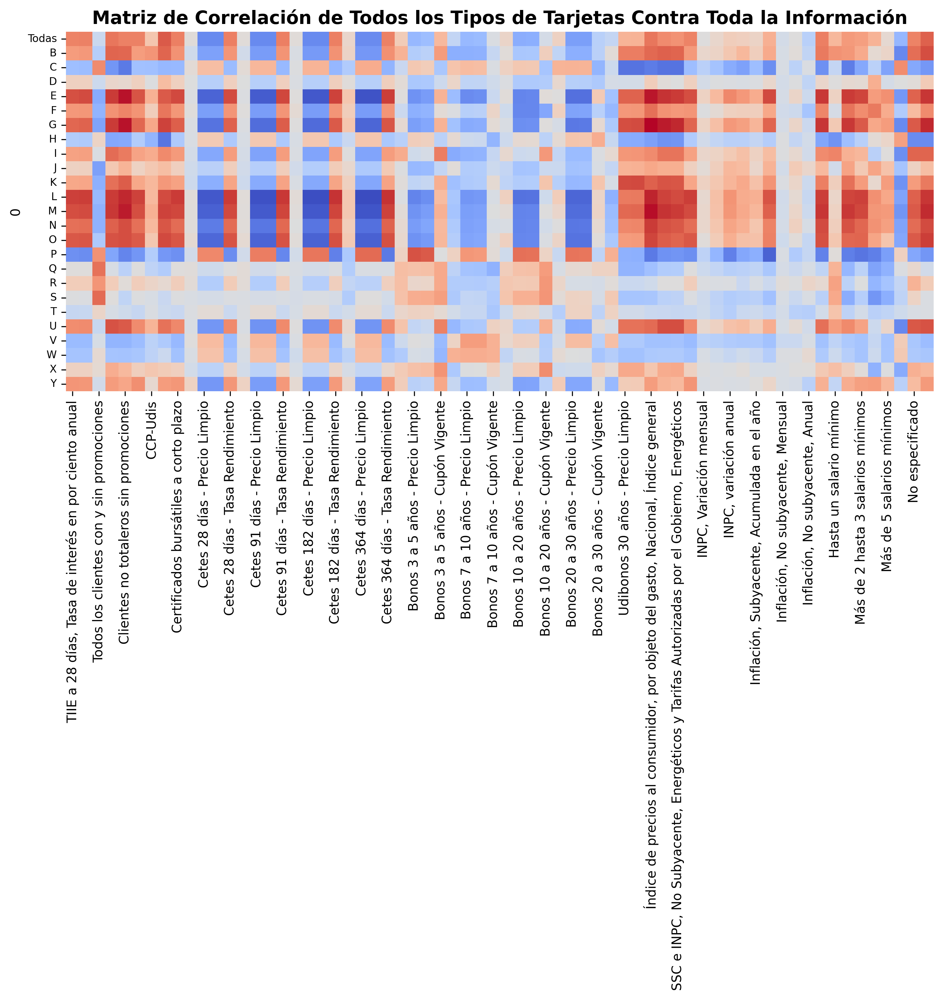

In [374]:
orig_todas_las_marcas = df2.columns[df2.columns.str.contains("todas las marcas")]
tdc = df2[orig_todas_las_marcas]
tdc_clean = tdc.copy()
tdc_clean.columns = tdc_clean.columns.str.replace("(todas las marcas) ", "")

# change the name of the first column
tdc_clean.rename(columns={tdc_clean.columns[0]: "Todas"}, inplace=True)

# Compute the correlation matrix
corr_matrix = dffinal.corr()

# Get the df2 columns and the columns of the other dataframes
df2_cols = df2.columns
other_cols = [col for col in dffinal.columns if col not in df2_cols]

# Extract the rectangular correlation matrix: rows from the original df2 columns matching "todas las marcas" and columns from the others
df2_corr_rect = corr_matrix.loc[orig_todas_las_marcas, other_cols]
df2_corr_rect.index = tdc_clean.columns

# Plot the correlation matrix without labels and numbers
plt.figure(figsize=(12, 5), dpi=300)
sns.heatmap(df2_corr_rect, annot=False, cmap='coolwarm',  cbar=False)
plt.title("Matriz de Correlación de Todos los Tipos de Tarjetas Contra Toda la Información", fontsize=14, fontweight='bold')
plt.yticks(fontsize=8)
plt.savefig("Datos\\SVG\\Correlación de Todas las Tarjetas.svg")
plt.show()

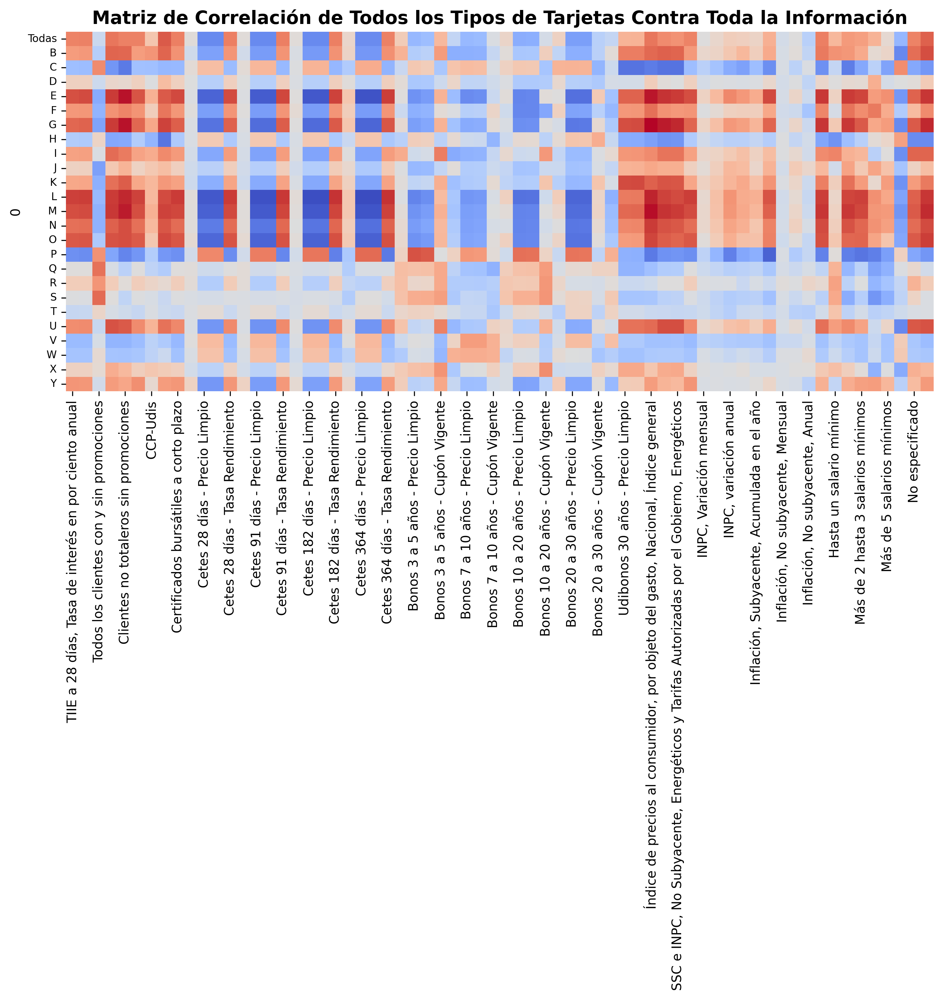

In [375]:
# Plot the correlation matrix without labels and numbers
plt.figure(figsize=(12, 5), dpi=300)
sns.heatmap(df2_corr_rect, annot=False, cmap='coolwarm',  cbar=False)
plt.title("Matriz de Correlación de Todos los Tipos de Tarjetas Contra Toda la Información", fontsize=14, fontweight='bold')
plt.yticks(fontsize=8)
plt.savefig("Datos\\SVG\\Correlación de Todas las Tarjetas.svg")
plt.show()

0
 G       11.333040
 U       11.151088
 M       10.910271
 E       10.730815
 K       10.402894
 L        9.990608
 I        9.484746
 N        9.185029
 B        9.091572
 O        8.973154
Todas     7.344162
 X        7.148426
 F        5.546789
 Y        4.388240
 J        3.740847
 R        3.190674
 D        0.308770
 S       -0.174358
 T       -1.579772
 Q       -1.582087
 V       -3.997415
 W       -4.123957
 P       -6.181143
 H       -7.398516
 C       -8.750922
dtype: float64


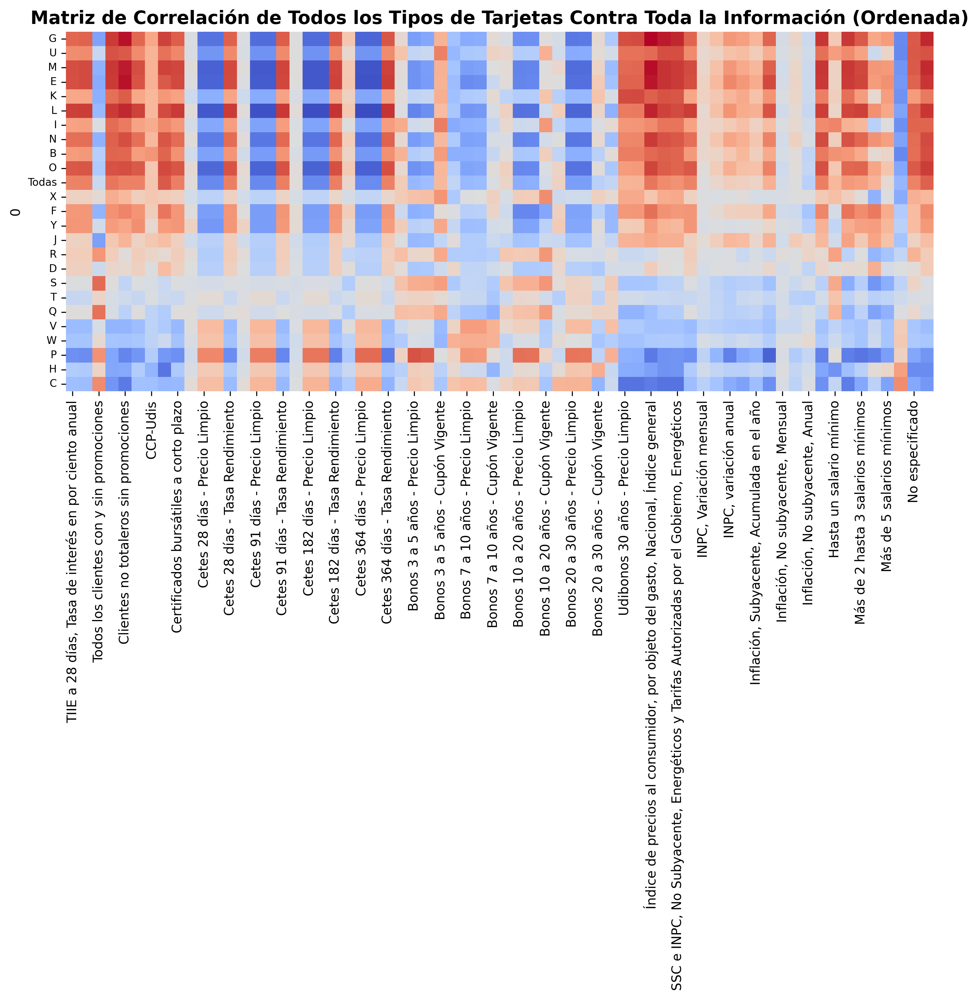

In [376]:
row_sums = df2_corr_rect.sum(axis=1).sort_values(ascending=False)
print(row_sums)

# Plot the correlation matrix ordered by row sums
plt.figure(figsize=(12, 5), dpi=300)
sns.heatmap(df2_corr_rect.loc[row_sums.index], annot=False, cmap='coolwarm', cbar=False)
plt.title("Matriz de Correlación de Todos los Tipos de Tarjetas Contra Toda la Información (Ordenada)", fontsize=14, fontweight='bold')
plt.yticks(fontsize=8)
plt.savefig("Datos\\SVG\\Correlación de Todas las Tarjetas Ordenada.svg")
plt.show()

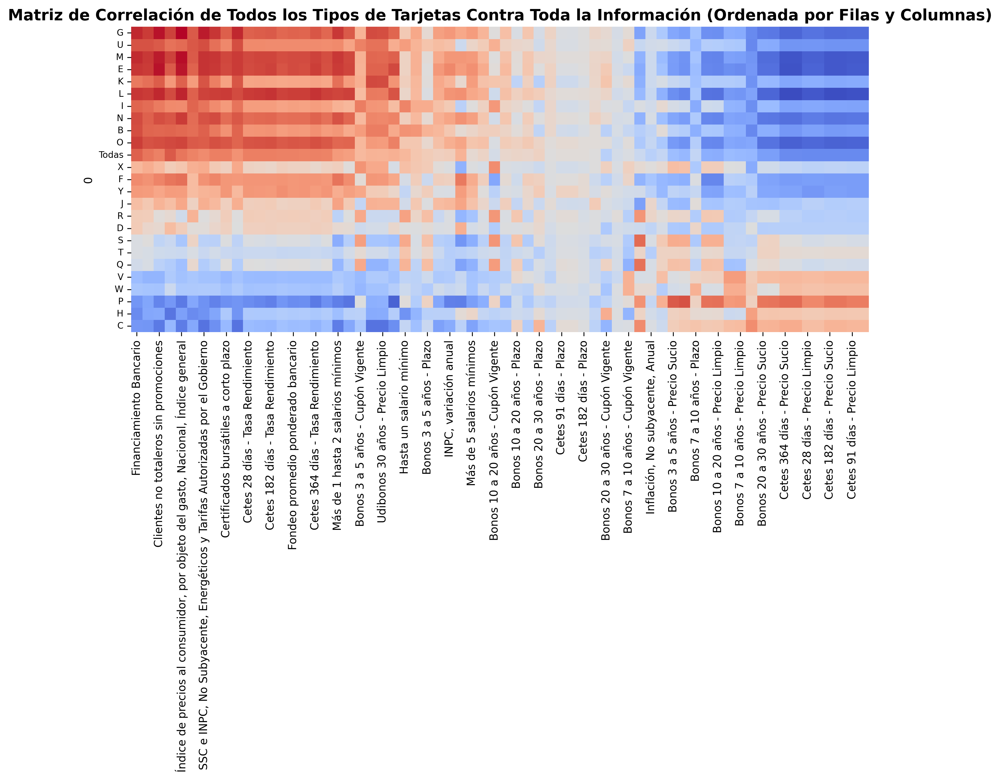

In [377]:
# Sum the correlations for rows and columns
row_sums = df2_corr_rect.sum(axis=1).sort_values(ascending=False)
col_sums = df2_corr_rect.sum(axis=0).sort_values(ascending=False)

# Order the correlation matrix by row and column sums
ordered_corr_matrix = df2_corr_rect.loc[row_sums.index, col_sums.index]

# Plot the ordered correlation matrix
plt.figure(figsize=(12, 5), dpi=300)
sns.heatmap(ordered_corr_matrix, cmap='coolwarm', cbar=False)
plt.title("Matriz de Correlación de Todos los Tipos de Tarjetas Contra Toda la Información (Ordenada por Filas y Columnas)", fontsize=14, fontweight='bold')
plt.yticks(fontsize=8)
plt.savefig("Datos\\SVG\\Correlación de Todas las Tarjetas Ordenada por Filas y Columnas.svg")
plt.show()

queremos evitar los degradados

In [378]:
dffinal.columns

Index([' Tarjetas vigentes al cierre del trimestre (todas las marcas)',
       ' (todas las marcas) B', ' (todas las marcas) C',
       ' (todas las marcas) D', ' (todas las marcas) E',
       ' (todas las marcas) F', ' (todas las marcas) G',
       ' (todas las marcas) H', ' (todas las marcas) I',
       ' (todas las marcas) J',
       ...
       'Inflación, No subyacente, Anual', 'Población ocupada por',
       'Hasta un salario mínimo', 'Más de 1 hasta 2 salarios mínimos',
       'Más de 2 hasta 3 salarios mínimos',
       'Más de 3 hasta 5 salarios mínimos', 'Más de 5 salarios mínimos',
       'No recibe ingresos 4', 'No especificado', 'Financiamiento Bancario'],
      dtype='object', length=138)

In [379]:
# drop the column that is called CPP and Tasa Objetivo
dffinal = dffinal.drop(["CCP", "Tasa objetivo", "Certificados bursátiles a corto plazo"], axis=1)

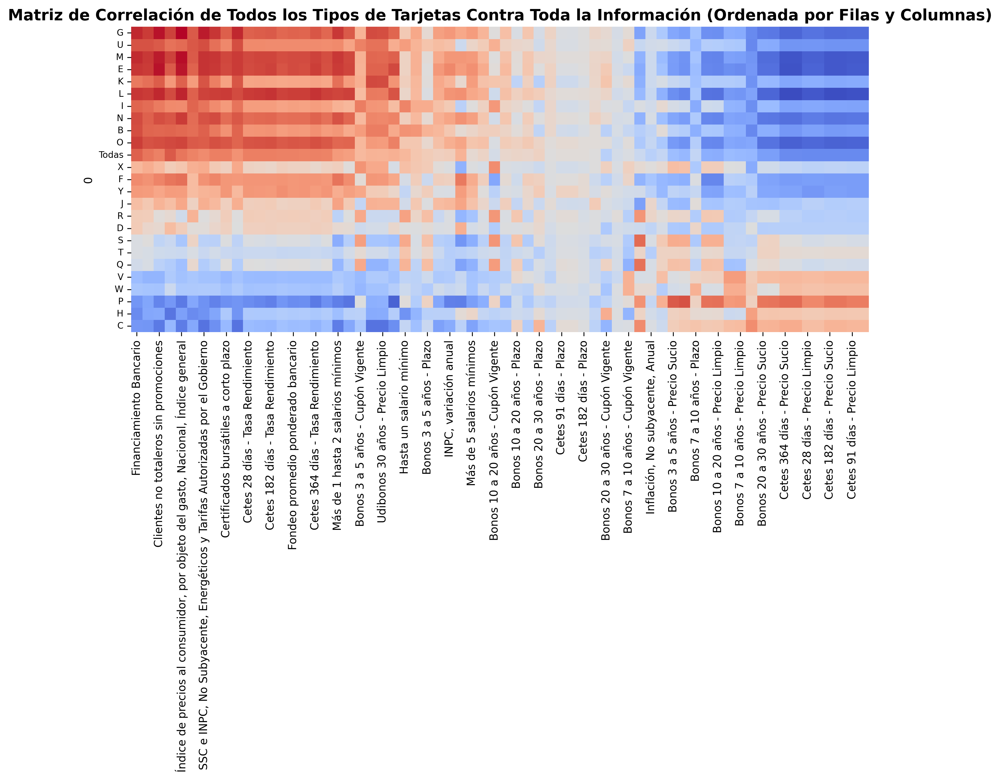

In [380]:
# Plot the ordered correlation matrix
plt.figure(figsize=(12, 5), dpi=300)
sns.heatmap(ordered_corr_matrix, annot=False, cmap='coolwarm', cbar=False)
plt.title("Matriz de Correlación de Todos los Tipos de Tarjetas Contra Toda la Información (Ordenada por Filas y Columnas)", fontsize=14, fontweight='bold')
plt.yticks(fontsize=8)
plt.savefig("Datos\\SVG\\Correlación de Todas las Tarjetas Ordenada por Filas y Columnas.svg")
plt.show()

In [381]:
# change the name of the first column
tdc_clean.rename(columns={tdc_clean.columns[0]: "Todas"}, inplace=True)

# Compute the correlation matrix
corr_matrix = dffinal.corr()

# Get the df2 columns and the columns of the other dataframes
df2_cols = df2.columns
other_cols = [col for col in dffinal.columns if col not in df2_cols]

# Extract the rectangular correlation matrix: rows from the original df2 columns matching "todas las marcas" and columns from the others
df2_corr_rect = corr_matrix.loc[orig_todas_las_marcas, other_cols]
df2_corr_rect.index = tdc_clean.columns


0
 U       9.392808
 G       9.099700
 K       9.015278
 M       8.421347
 E       8.277867
 I       8.018158
 B       7.524995
 L       7.381493
 N       7.086044
 O       6.616921
 X       6.570187
Todas    5.461746
 F       3.940222
 J       3.186626
 Y       2.748692
 R       2.555495
 D      -0.249046
 S      -0.262561
 T      -1.277083
 Q      -1.730417
 V      -2.927649
 W      -3.232265
 P      -4.397346
 H      -6.683259
 C      -7.724793
dtype: float64


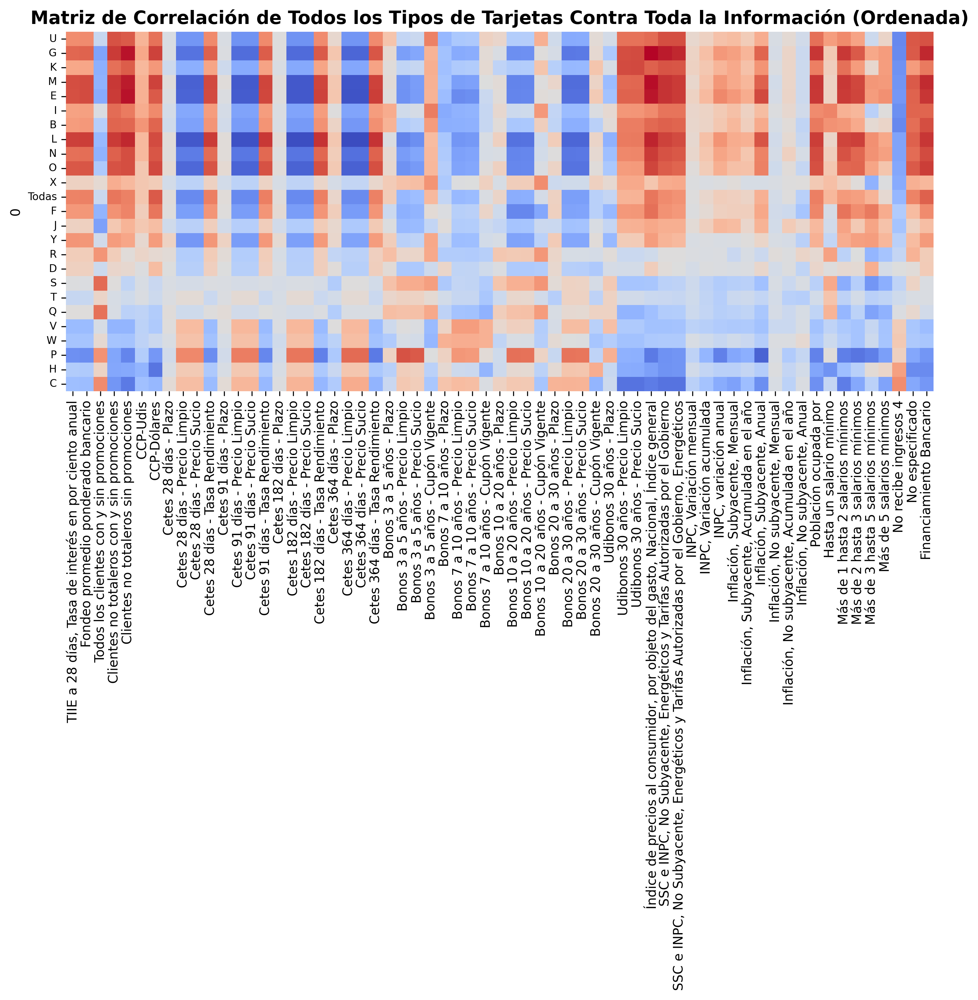

In [382]:
row_sums = df2_corr_rect.sum(axis=1).sort_values(ascending=False)
print(row_sums)

# Plot the correlation matrix ordered by row sums
plt.figure(figsize=(12, 5), dpi=300)
sns.heatmap(df2_corr_rect.loc[row_sums.index], annot=False, cmap='coolwarm', cbar=False)
plt.title("Matriz de Correlación de Todos los Tipos de Tarjetas Contra Toda la Información (Ordenada)", fontsize=14, fontweight='bold')
plt.yticks(fontsize=8)
plt.savefig("Datos\\SVG\\Correlación de Todas las Tarjetas Ordenada.svg")
plt.show()

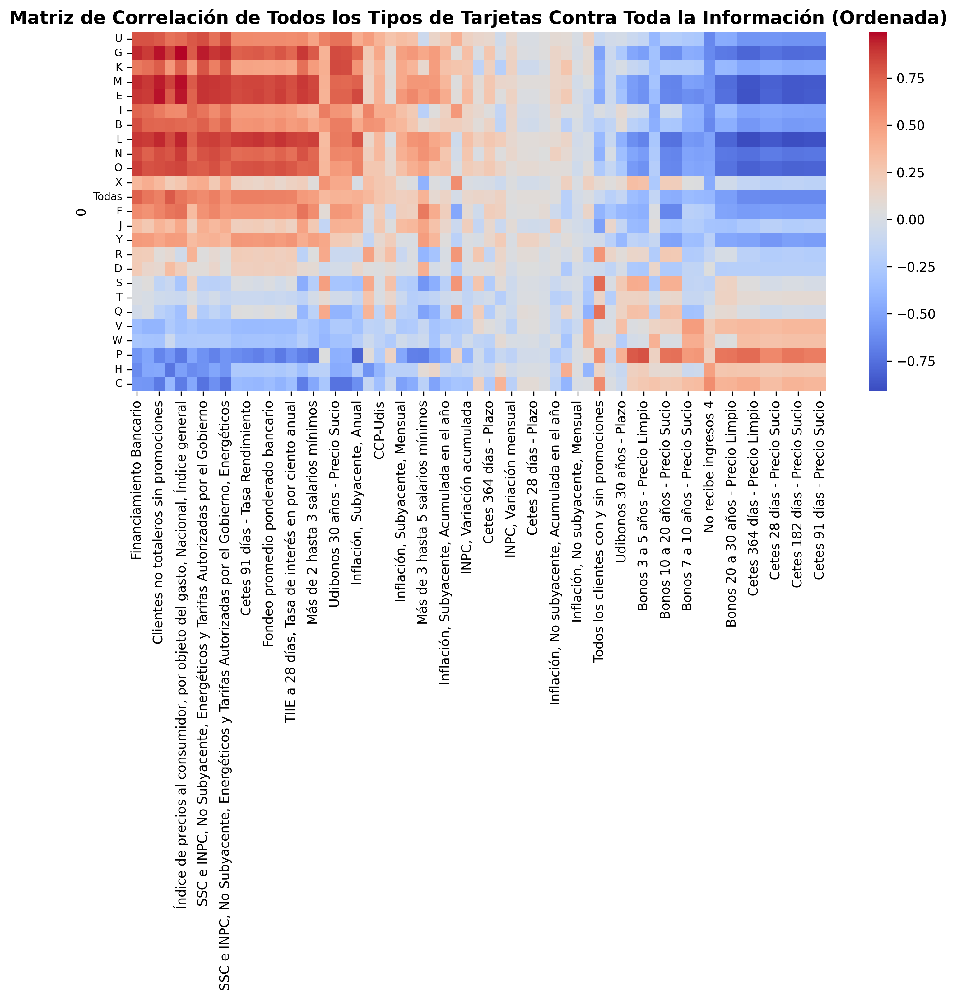

In [383]:
# Sum the correlations for rows and columns
row_sums = df2_corr_rect.sum(axis=1).sort_values(ascending=False)
col_sums = df2_corr_rect.sum(axis=0).sort_values(ascending=False)

# Order the correlation matrix by row and column sums
ordered_corr_matrix = df2_corr_rect.loc[row_sums.index, col_sums.index]

# Plot the ordered correlation matrix
plt.figure(figsize=(12, 5), dpi=300)
sns.heatmap(ordered_corr_matrix, annot=False, cmap='coolwarm', cbar=True)
plt.title("Matriz de Correlación de Todos los Tipos de Tarjetas Contra Toda la Información (Ordenada)", fontsize=14, fontweight='bold')
plt.yticks(fontsize=8)
plt.savefig("Datos\\SVG\\Correlación de Todas las Tarjetas Ordenada por Filas y Columnas 2.svg")
plt.show()

In [384]:
dffinal.to_csv("datos-finales.csv")